## Importing required packages

In [1]:
library(Seurat)
library(RCurl)
library(cowplot)
library(tidyverse)
library(ggplot2)
library(clustree)
library(gridExtra)
library(grid)

# Set seed
set.seed(123456)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.2     ✔ tibble    3.3.0
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.1.0     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ tidyr::complete()  masks RCurl::complete()
✖ dplyr::filter()    masks stats::filter()
✖ dplyr::lag()       masks stats::lag()
✖ lubridate::stamp() masks cowplot::stamp()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: ggraph


Attaching package: ‘ggraph’


The following object is masked from ‘package:sp’:

    geometry



Attaching package: ‘gridExtra’


The following object is masked from

## Loading required files

In [2]:
# load trimmed data from previous script
user_file_dir_trimmed = readline(prompt = "Please enter file directory to NOVOall_SRAT_TRIMMED: ")
NOVOall_SRAT_TRIMMED = readRDS(user_file_dir_trimmed)

Please enter file directory to NOVOall_SRAT_TRIMMED:  ../data_files2/NOVOall_SRAT_TRIMMED.rds


The following code chunk can be run only after the rest of the script has been run. 

In [3]:
# load normalised and scaled data 
user_dir1 = readline(prompt = "Please enter the file directory to load LOG_NORM_NOVOALL_filt: ")
LOG_NORM_NOVOALL_filt = readRDS(user_dir1)

# load after PCA data 
user_dir2 = readline(prompt = "Please enter the file directory to load LOG_NORM_NOVOALL_filt_PCA: ")
LOG_NORM_NOVOALL_filt_PCA = readRDS(user_dir2)

# load after findneighbours
user_dir3 = readline(prompt = "Please enter file directory to load LOG_NORM_NOVOALL_filt_neigh: ") # add .rds extension
LOG_NORM_NOVOALL_filt_neigh = readRDS(user_dir3)

# load after findclusters
user_dir4 = readline(prompt = "Please enter file directory to load LOG_NORM_NOVOALL_filt_clust: ") # add .rds extension
LOG_NORM_NOVOALL_filt_clust = readRDS(user_dir4)

# load after umap 
user_dir5 = readline(prompt = "Please enter file directory to load LOG_NORM_NOVOALL_filt_umap: ")
LOG_NORM_NOVOALL_filt_umap = readRDS(user_dir5)

## Log normalisation using NormalizeData() and scaling using ScaleData()
This is one of the normalization techniques, the other being SCTransform which is in a separate script.

In [3]:
# Log normalisation
LOG_NORM_NOVOALL_filt <- NormalizeData(NOVOall_SRAT_TRIMMED)

# identify the most variable genes
LOG_NORM_NOVOALL_filt <- FindVariableFeatures(LOG_NORM_NOVOALL_filt, 
                     selection.method = "vst",
                     nfeatures = 2000, 
                     verbose = FALSE)

# scale the counts 
LOG_NORM_NOVOALL_filt <- ScaleData(LOG_NORM_NOVOALL_filt)

Normalizing layer: counts.NOVO_WHOLE_SAMPLE_WT_1.NOVO_WHOLE_WT

Normalizing layer: counts.NOVO_WHOLE_SAMPLE_WT_2.NOVO_WHOLE_WT

Normalizing layer: counts.NOVO_WHOLE_SAMPLE_C246X_1.NOVO_WHOLE_C246X

Normalizing layer: counts.NOVO_WHOLE_SAMPLE_C246X_2.NOVO_WHOLE_C246X

Centering and scaling data matrix



In [28]:
# save normalised and scaled data 
user_dir = readline(prompt = "Please enter the file directory to save LOG_NORM_NOVOALL_filt: ") # remember to add the .rds extension
saveRDS(LOG_NORM_NOVOALL_filt, file = user_dir) 

Please enter the file directory to save LOG_NORM_NOVOALL_filt:  ../data_files2/LOG_NORM_NOVOALL_filt.rds


## Plot average expression and variance of 15 most highly variable genes

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 2056 rows containing missing values or values outside the scale range
(`geom_point()`).”


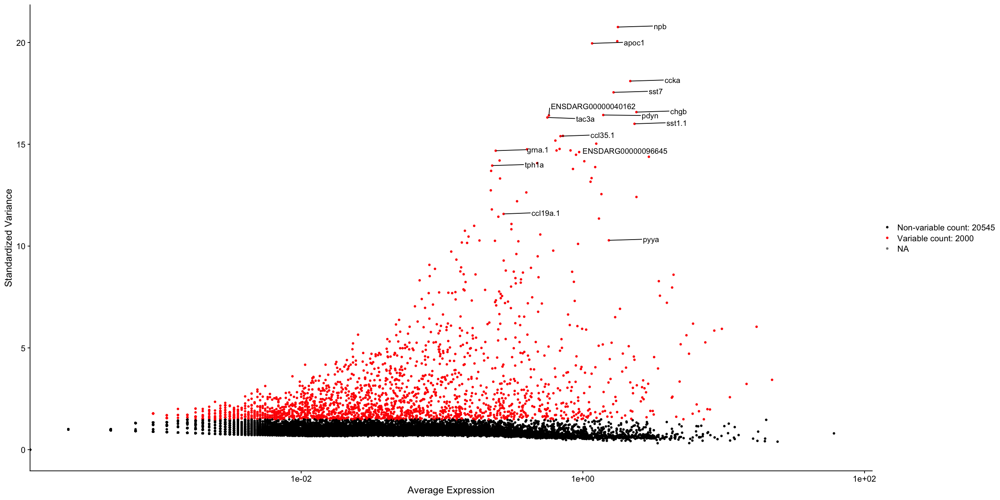

In [4]:
options(repr.plot.width=20, repr.plot.height=10)

# first identify 15 most highly variable genes
ranked_variable_genes <- VariableFeatures(LOG_NORM_NOVOALL_filt)
top_genes <- ranked_variable_genes[1:15]

# plot and add labels to indicate which genes are in the top 15
p <- VariableFeaturePlot(LOG_NORM_NOVOALL_filt)
LabelPoints(plot = p, points = top_genes, repel = TRUE)

## PCA plots

In [5]:
# Perform PCA (dimensionality reduction)

LOG_NORM_NOVOALL_filt_PCA <- RunPCA(LOG_NORM_NOVOALL_filt)

PC_ 1 
Positive:  zgc:64051, ENSDARG00000105408, ENSDARG00000096655, arpc1b, pfn1, b2m, ENSDARG00000095562, cd74b, srgn, mhc2daa 
	   ENSDARG00000071437, lcp1, ENSDARG00000101785, si:dkey-27i16.2, coro1a, itm2bb, mhc1uba, cd74a, cxcr4b, wasb 
	   ENSDARG00000087645, rgs13, si:busm1-266f07.1, spi1b, vsir, ENSDARG00000088612, ENSDARG00000055504, si:ch211-79k12.1, mpeg1.1, ENSDARG00000057787 
Negative:  scg2b, atp1b1b, nrxn1a, egr4, ENSDARG00000105529, bdnf, nrn1a, nptx1l, stmn4l, gap43 
	   hspa8b, trim9, dnajb4, slc35g2a, ENSDARG00000097648, homer1b, vamp1a, scg3, itm2cb, uchl1 
	   ndrg3a, TENT5D, NELL2, chga, PPP4R4, ADGRB1.1, ENSDARG00000075513, glipr1b, pcp4a, chn1 
PC_ 2 
Positive:  dhrs12la, cldnk, csrp1b, ENSDARG00000074285, ENSDARG00000095294, timd4, ENSDARG00000036186, ENSDARG00000089828, mpz, ENSDARG00000089255 
	   stxbp6l, plp1b, cdaa, cd9b, ENSDARG00000071454, MYRF, gjb1a, qki2, ppp1r14aa, cd82a 
	   fabp2, ninj2, ENSDARG00000094045, cd59, tmem125b, ENSDARG00000113045, ENSD

In [33]:
# save file 
user_dir2 = readline(prompt = "Please enter the file directory to save LOG_NORM_NOVOALL_filt_PCA: ") # remember to add the .rds extension
saveRDS(LOG_NORM_NOVOALL_filt_PCA, file = user_dir2) 

Please enter the file directory to save LOG_NORM_NOVOALL_filt_PCA:  ../data_files2/LOG_NORM_NOVOALL_filt_PCA.rds


### Plot PCA for all genotypes together

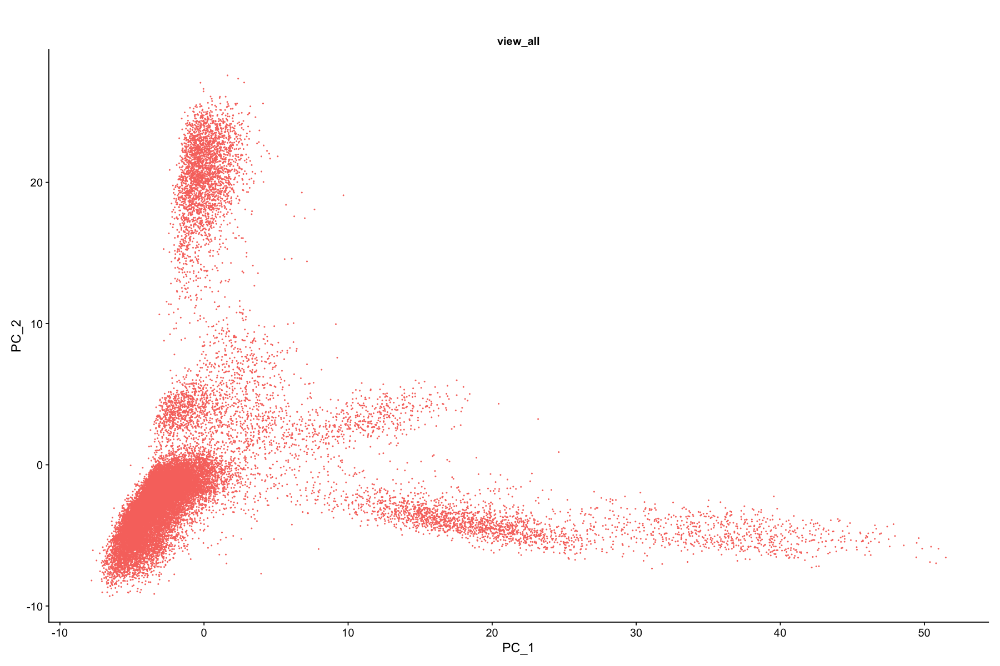

In [34]:
options(repr.plot.width=15, repr.plot.height=10)

# Plot PCA (note that each point on the plot is a cell)

DimPlot(LOG_NORM_NOVOALL_filt_PCA,
        reduction = "pca",
        group.by = "ALL",
        split.by = "ALL") + 
    NoLegend() + 
    labs(title = "")

### Check if cell distribution is similar for each genotype

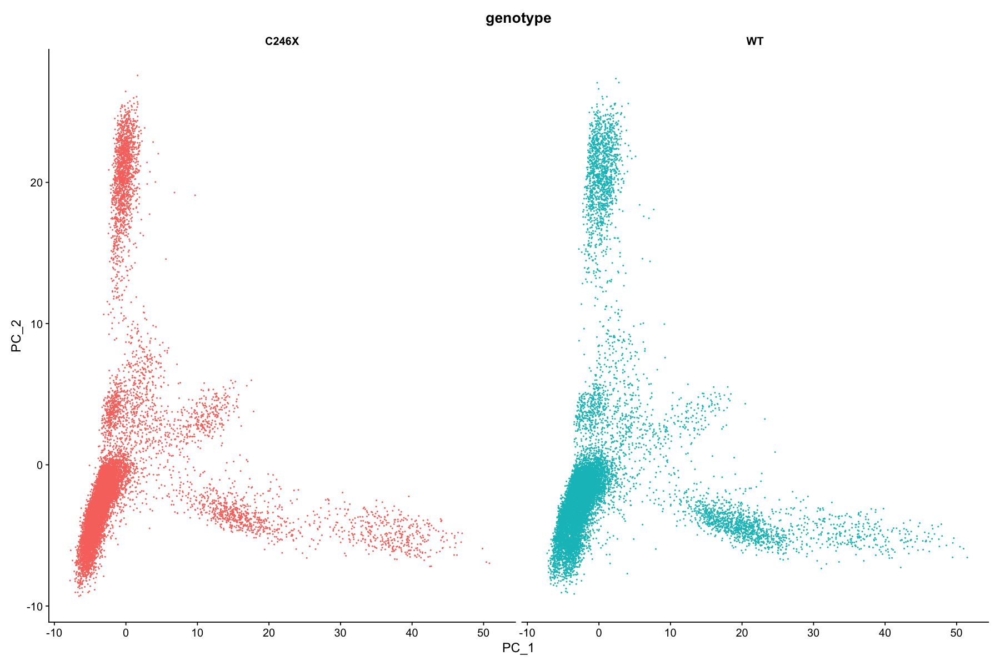

In [35]:
DimPlot(LOG_NORM_NOVOALL_filt_PCA,
        reduction = "pca",
        group.by = "genotype",
        split.by = "genotype") + 
    theme(legend.position = "none")

### Plotting PCA based on mitochondrial ratio 

In [36]:
# Evaluating mitochondrial expression

# Check quartile values
summary(LOG_NORM_NOVOALL_filt_PCA@meta.data$mitoRatio)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.01710 0.02445 0.02670 0.03377 0.07493 

In [37]:
# put the values above into the following variables
q1 = as.numeric(readline(prompt = "Please enter the 1st Qu. value obtained above: "))
median = as.numeric(readline(prompt = "Please enter the median value obtained above: "))
q3 = as.numeric(readline(prompt = "Please enter the 3rd Qu. value obtained above: "))

Please enter the 1st Qu. value obtained above:  0.01710
Please enter the median value obtained above:  0.02445
Please enter the 3rd Qu. value obtained above:  0.03377


In [38]:
# Turn mitoRatio into categorical factor vector based on quartile values - insert the summary quartile values into the 'breaks' line
LOG_NORM_NOVOALL_filt_PCA@meta.data$mitoFr <- cut(LOG_NORM_NOVOALL_filt_PCA@meta.data$mitoRatio, 
                   breaks=c(-Inf, q1, median, q3, Inf), 
                   labels=c("Low","Medium","Medium high", "High"))

Plot PCA based on mitochondrial ratio. If these plots look similar, then mitochondrial ratio isn't a major factor that will affect clustering and doesn't need to be regressed out.

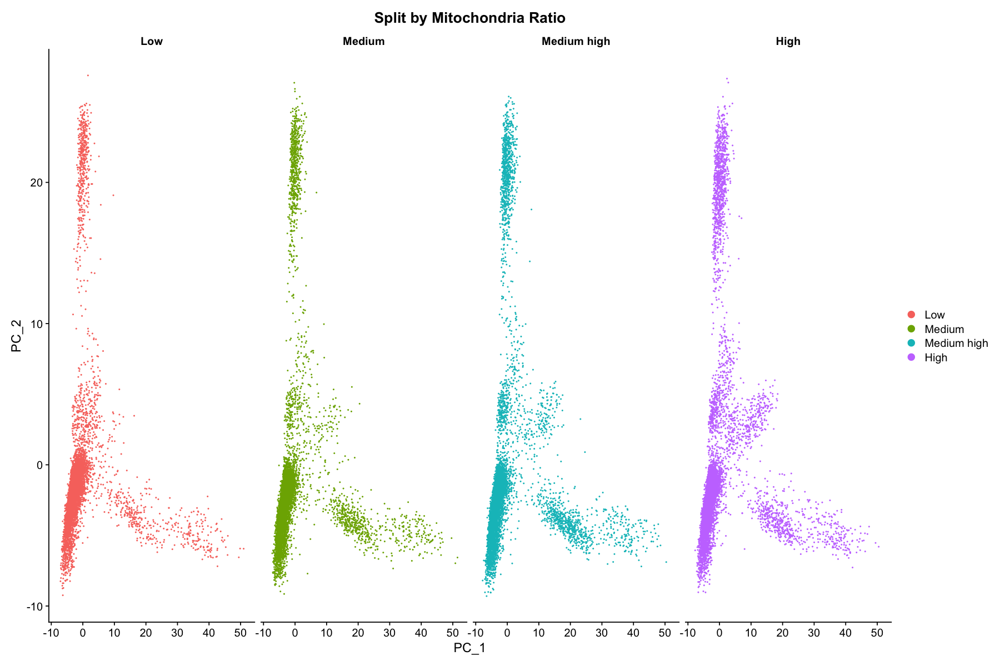

In [39]:
# for all the cells

DimPlot(LOG_NORM_NOVOALL_filt_PCA,
        reduction = "pca",
        group.by = "mitoFr",
        split.by = "mitoFr") +
    ggtitle("Split by Mitochondria Ratio")

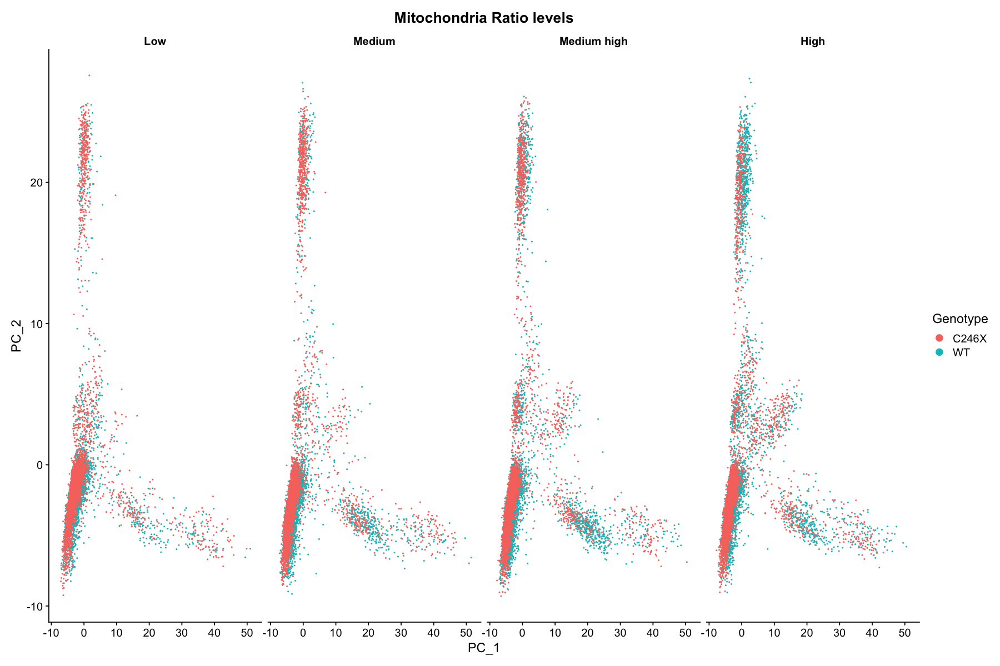

In [40]:
# colour by genotype

DimPlot(LOG_NORM_NOVOALL_filt_PCA,
        reduction = "pca",
        group.by = "genotype",
        split.by = "mitoFr") + 
labs(color = "Genotype", title = "Mitochondria Ratio levels")

## Elbow plot
This plot is used to see where the PCA stops describing the data. The initial biggest differences come from differences in the cell types.

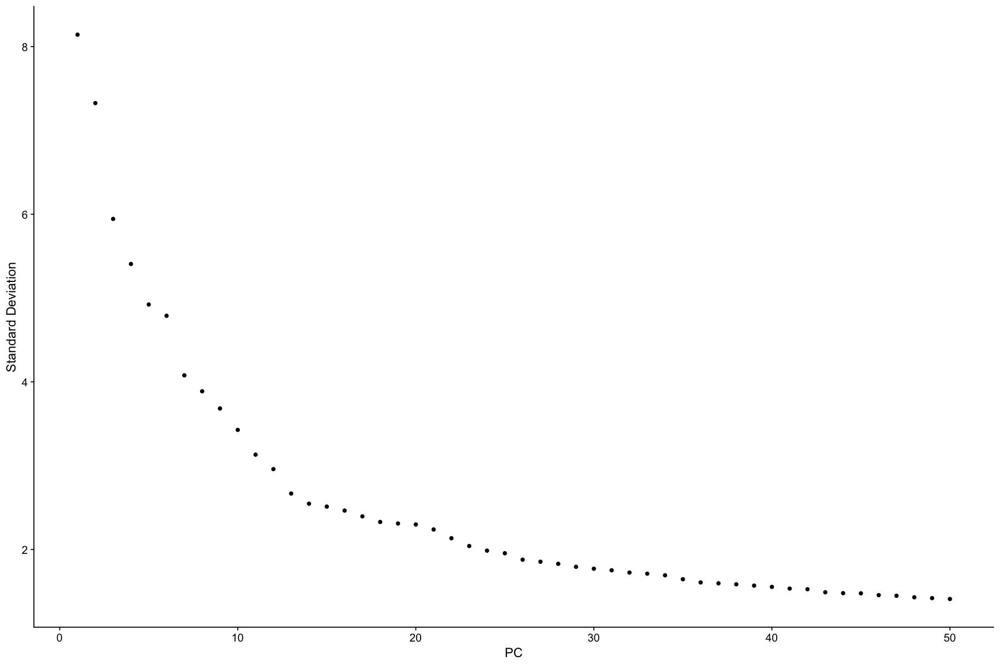

In [41]:
ElbowPlot(LOG_NORM_NOVOALL_filt_PCA, ndims = 50)

## Find neighbours

In [42]:
dim_input = as.numeric(readline(prompt = "Please input number of dimensions: "))
LOG_NORM_NOVOALL_filt_neigh <- FindNeighbors(LOG_NORM_NOVOALL_filt_PCA, dims = 1:dim_input, reduction = "pca")

Please input number of dimensions:  30


Computing nearest neighbor graph

Computing SNN



In [43]:
# save
user_dir3 = readline(prompt = "Please enter file directory to save LOG_NORM_NOVOALL_filt_neigh: ") # add .rds extension
saveRDS(LOG_NORM_NOVOALL_filt_neigh, file = user_dir3)

Please enter file directory to save LOG_NORM_NOVOALL_filt_neigh:  ../data_files2/LOG_NORM_NOVOALL_filt_neigh.rds


## Find clusters

In [44]:
# initially, the user may input 0.2,0.4,0.6,0.8
user_res_inp = readline(prompt = "Please provide a list of resolutions separated by a comma: ") 

Please provide a list of resolutions separated by a comma:  0.2,0.4,0.6,0.8


In [45]:
# split string at the comma and convert chars to numeric
res = as.numeric(str_split_1(user_res_inp, ",")) 

In [46]:
LOG_NORM_NOVOALL_filt_clust <- FindClusters(LOG_NORM_NOVOALL_filt_neigh, resolution = res)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1050575

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9720
Number of communities: 24
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1050575

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9549
Number of communities: 26
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1050575

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9388
Number of communities: 29
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1050575

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9267
Number of communities: 33
Elapsed time: 3 seconds


In [47]:
# save 
user_dir4 = readline(prompt = "Please enter file directory to save LOG_NORM_NOVOALL_filt_clust: ") # add .rds extension
saveRDS(LOG_NORM_NOVOALL_filt_clust, file = user_dir4)

Please enter file directory to save LOG_NORM_NOVOALL_filt_clust:  ../data_files2/LOG_NORM_NOVOALL_filt_clust.rds


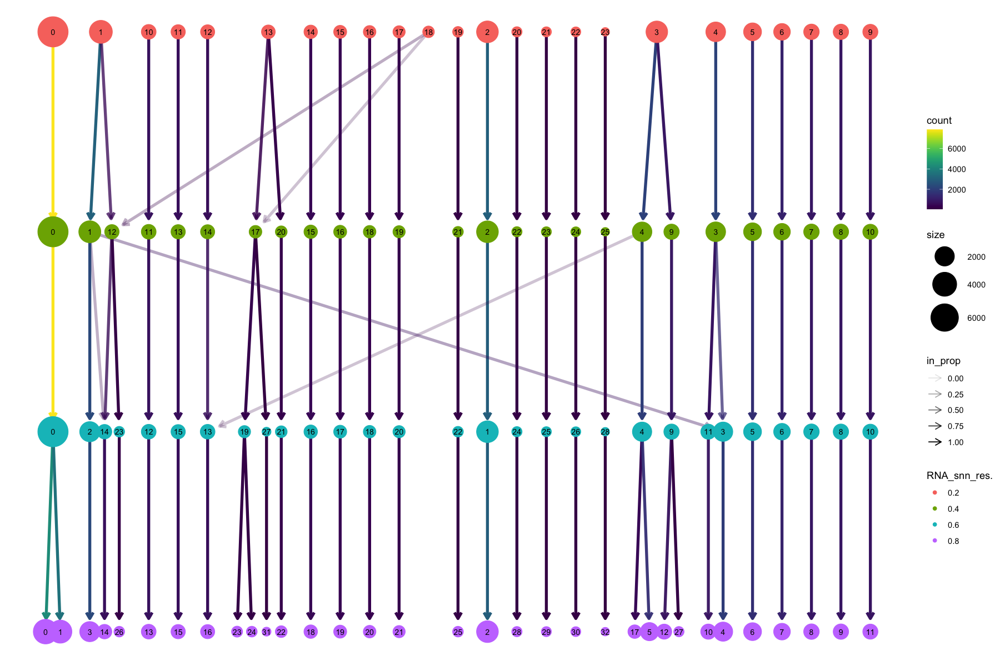

In [48]:
clustree(LOG_NORM_NOVOALL_filt_clust) 

### Cluster quality control - check number and proportion of cells in each cluster

If there are some clusters that don't have a genotype then that might mean integration is needed. 

In [49]:
plots_count = list()
plots_prop = list()

for (value in res) {
    resolution = as.character(value)

    # Extract cell identity and genotype info from seurat object to determine the number of cells per cluster per sample
    n_cells_cluster1 = LOG_NORM_NOVOALL_filt_clust@meta.data %>% 
                    select(c("orig.ident", "genotype", ends_with(resolution))) %>% 
                    rename(seurat_clusters = 3) %>% # rename the last col as seurat cluster to use in plot later
                    count(orig.ident, seurat_clusters, genotype) # count (orig.ident, seurat_cluster, genotype) triplets = number of cells in each cluster per sample, per genotype (since each row is one cell)

    # for the second barplot
    n_cells_cluster2 = LOG_NORM_NOVOALL_filt_clust@meta.data %>% 
                    select(c("orig.ident", "genotype", ends_with(resolution))) %>%
                    rename(seurat_clusters = 3)

    # Barplot of number of cells in each cluster, coloured by genotype
    p1 = ggplot(data = n_cells_cluster1, aes(x = seurat_clusters, y = n)) + 
              	geom_col(aes(fill = genotype), position = "stack", color = "black") + # use col bc y-vals alr pre-calculated, if using geom_bar --> then add stat = "identity" to tell R to use the pre-calculated values, note that position = "stack" is the default
                scale_y_continuous(breaks = seq(0, 15000, by = 1000)) + 
                theme_classic() + 
                labs(x = "Cluster Identity\n", y = "Cell Count", title = paste0("Resolution = ", resolution, "\n")) + 
                theme(axis.text.x = element_text(vjust = 1, size = 13),
                      axis.text.y = element_text(size = 13),
                      axis.title.x = element_text(size = 18),
                      axis.title.y = element_text(size = 18),
                      legend.text = element_text(size = 13),
                      legend.title = element_text(size = 15),
                      plot.title = element_text(size = 22, hjust = 0.5))

    # Barplot of proportion of cells in each cluster, coloured by genotype
    p2 = ggplot(n_cells_cluster2) +
            geom_bar(aes(x = seurat_clusters, fill = genotype), position = "fill") + 
            scale_y_continuous(breaks = seq(0, 1.0, by = 0.1)) + 
            theme_classic() + 
            labs(x = "Cluster Identity\n", y = "Proportion", title = paste0("Resolution = ", resolution)) +  
            theme(axis.text.x = element_text(vjust = 1, size = 13),
                  axis.text.y = element_text(size = 13),
                  axis.title.x = element_text(size = 18),
                  axis.title.y = element_text(size = 18),
                  legend.text = element_text(size = 13),
                  legend.title = element_text(size = 15),
                  plot.title = element_text(size = 22, hjust = 0.5))
    
    # save to lists
    plots_count[[paste0("plot", resolution)]] = p1
    plots_prop[[paste0("plot", resolution)]] = p2
    
    }
    

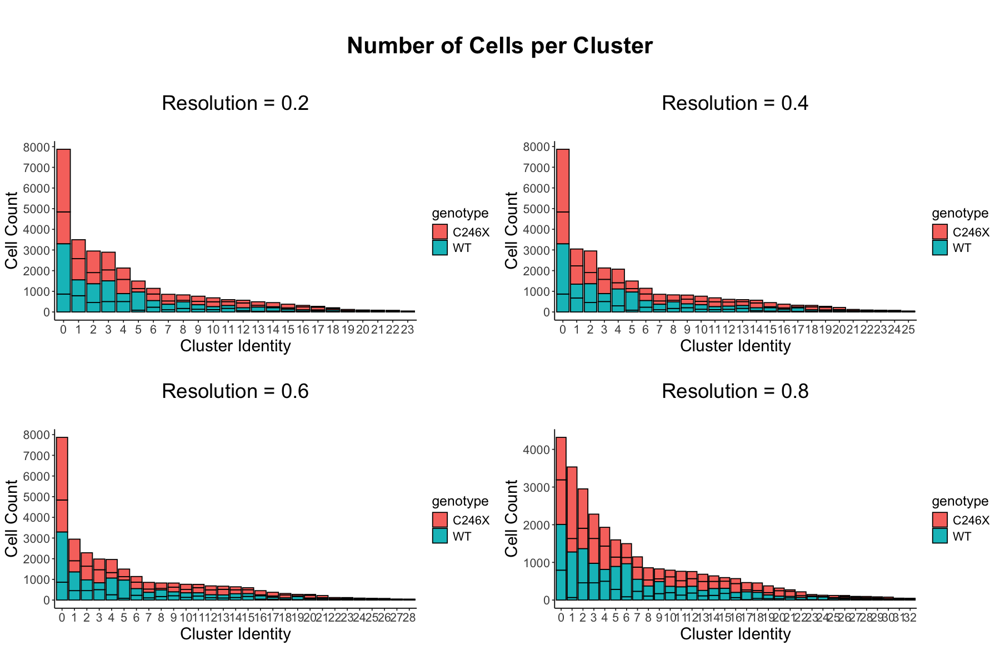

In [50]:
# Arrange plots in grid
grid.arrange(grobs = plots_count, ncol = ceiling(length(plots_count)/2),
             top = textGrob("\nNumber of Cells per Cluster\n", gp = gpar(fontsize = 25, fontface = "bold")))

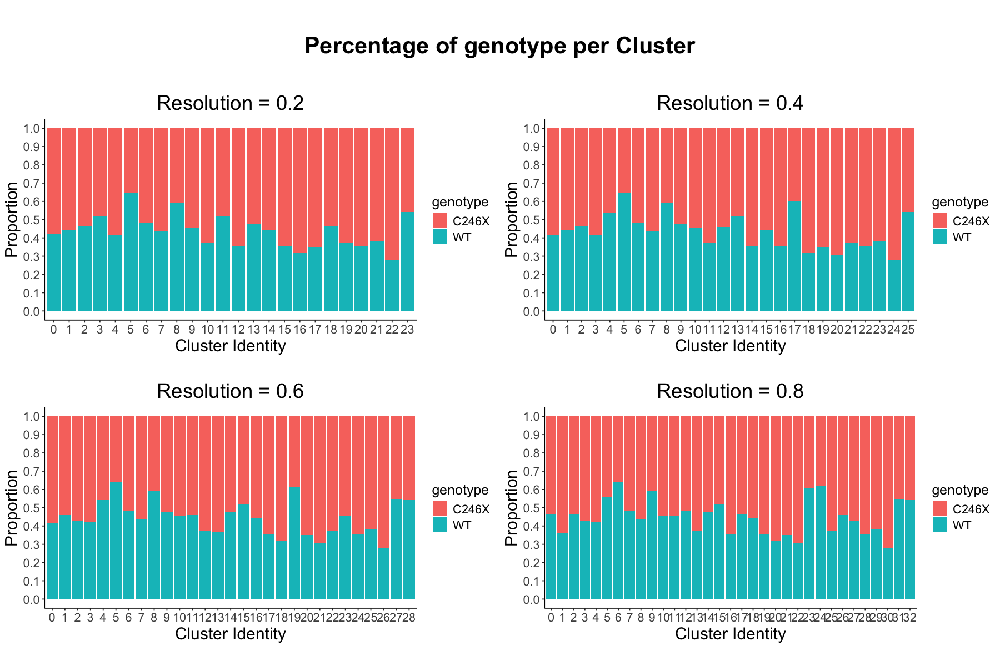

In [51]:
grid.arrange(grobs = plots_prop, ncol = ceiling(length(plots_prop)/2),
             top = textGrob("\nPercentage of genotype per Cluster\n", gp = gpar(fontsize = 25, fontface = "bold")))

## UMap
We will explore the cluster quality at the default resolution first. The resolution does not matter here. There will be an option to change it later!

In [60]:
LOG_NORM_NOVOALL_filt_umap <- RunUMAP(LOG_NORM_NOVOALL_filt_clust, dims = 1:30, reduction = "pca", reduction.name = "umap_unintegrated")

19:31:45 UMAP embedding parameters a = 0.9922 b = 1.112

19:31:45 Read 28839 rows and found 30 numeric columns

19:31:45 Using Annoy for neighbor search, n_neighbors = 30

19:31:45 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:31:46 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpAkYla2/file111f3947592a

19:31:46 Searching Annoy index using 1 thread, search_k = 3000

19:31:51 Annoy recall = 100%

19:31:52 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

19:31:52 Initializing from normalized Laplacian + noise (using RSpectra)

19:31:55 Commencing optimization for 200 epochs, with 1329128 positive edges

19:31:55 Using rng type: pcg

19:32:04 Optimization finished



In [61]:
# save
user_dir5 = readline(prompt = "Please enter file directory to save LOG_NORM_NOVOALL_filt_umap: ")
saveRDS(LOG_NORM_NOVOALL_filt_umap, user_dir5)

Please enter file directory to save LOG_NORM_NOVOALL_filt_umap:  ../data_files2/LOG_NORM_NOVOALL_filt_umap.rds


## Dimension plots 

### Overall UMAP
Before we explore the cluster quality.

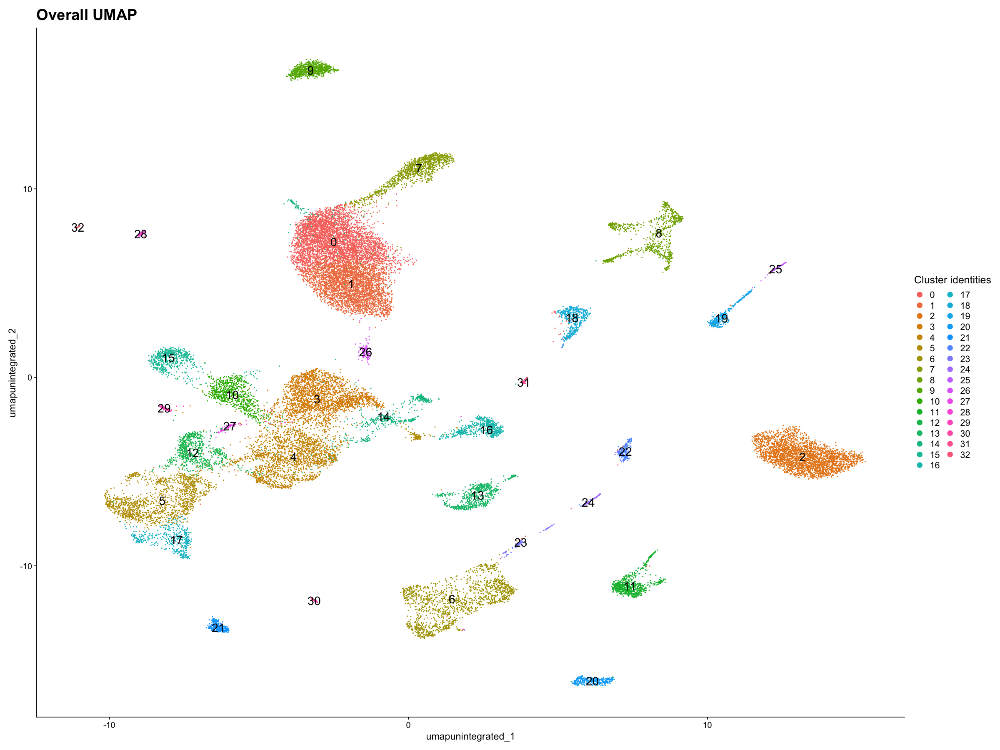

In [62]:
options(repr.plot.width=20, repr.plot.height=15)

DimPlot(LOG_NORM_NOVOALL_filt_umap, reduction = "umap_unintegrated", label = TRUE, label.size = 6) +  
    ggtitle("Overall UMAP") + 
    labs(color = "Cluster identities") + 
    theme(legend.text = element_text(size = 13),
          legend.title = element_text(size = 15),
          plot.title = element_text(size = 22))

### Cluster quality after running UMAP

#### Feature plot (column features)
We would like all clusters to look pale across the plot. If any one cluster stands out, integration might be needed.

Note that the resolution does not necessarily matter here as we just want to see the colour across the plot. At a different resolution, the plot would look the same, the only thing changing would be the cluster numbers.

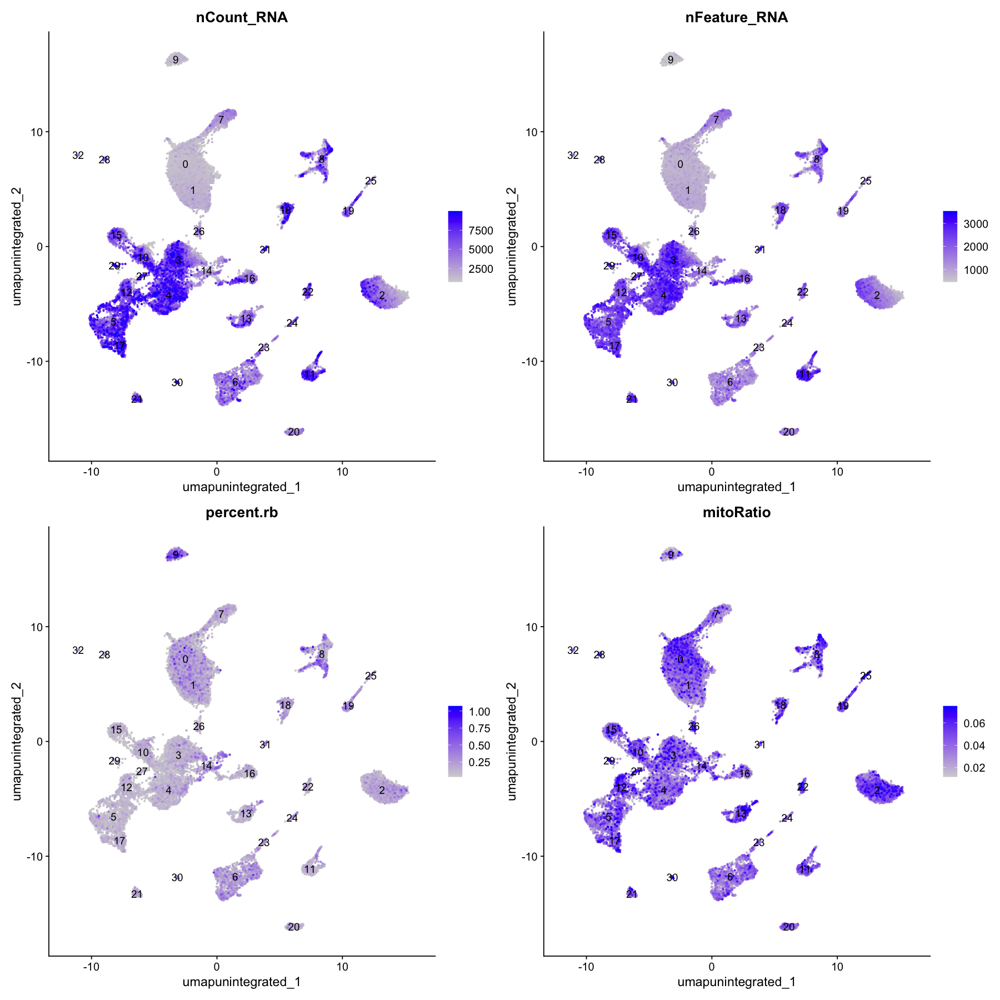

In [63]:
options(repr.plot.width=15, repr.plot.height=15)

# Determine metrics to plot present in seurat_integrated@meta.data
metrics <-  c("nCount_RNA", "nFeature_RNA", "percent.rb", "mitoRatio")

FeaturePlot(LOG_NORM_NOVOALL_filt_umap, 
            reduction = "umap_unintegrated", 
            features = metrics,
            pt.size = 0.4, 
            order = TRUE,
            min.cutoff = 'q10',
            label = TRUE)

#### UMAP of cells in each cluster by genotype

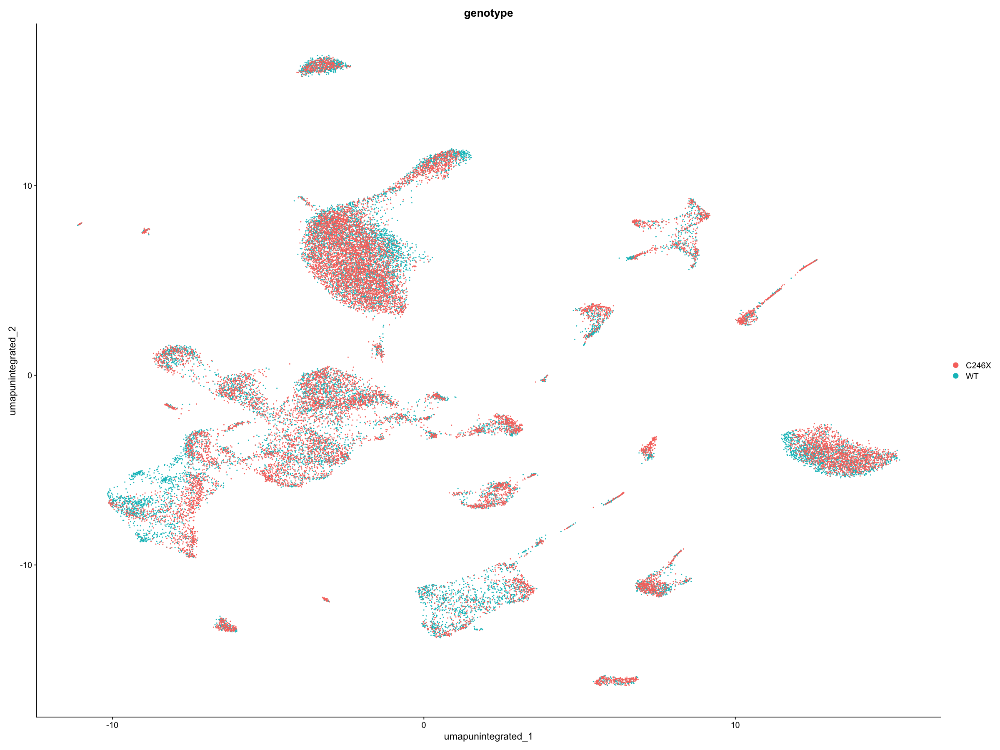

In [16]:
options(repr.plot.width=20, repr.plot.height=15)

DimPlot(LOG_NORM_NOVOALL_filt_umap, 
        label = FALSE, label.size = 5,
        group.by = "genotype")

#### Boxplot (alternate visulisation to UMAP)
Number of genes (features) per cluster

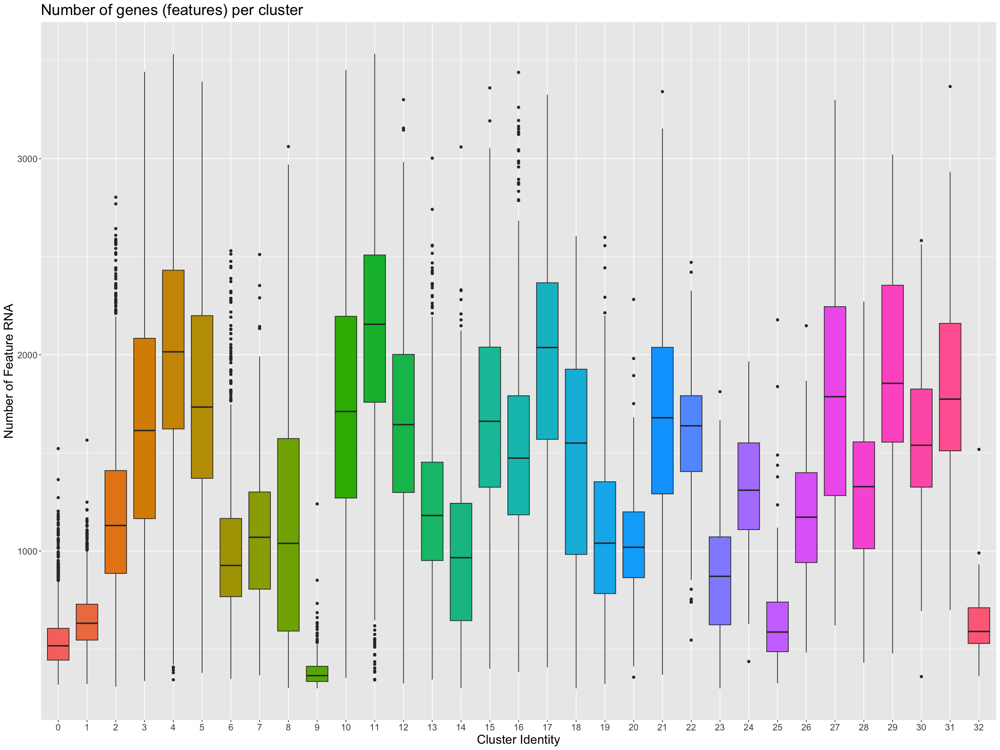

In [65]:
ggplot(LOG_NORM_NOVOALL_filt_umap@meta.data) +
    geom_boxplot(aes(x=seurat_clusters, y=nFeature_RNA, fill=seurat_clusters)) +
    labs(x = "Cluster Identity", y = "Number of Feature RNA") + 
    ggtitle("Number of genes (features) per cluster") + 
    theme(axis.text.x = element_text(vjust = 1, size = 13),
          axis.text.y = element_text(size = 13),
          axis.title.x = element_text(size = 18),
          axis.title.y = element_text(size = 18),
          plot.title = element_text(size = 22)) + 
    NoLegend()

### Looking at different resolutions
Note that this code will take ~5 minutes to run

In [58]:
# loop through the resolutions and run findclusters and umap for each value

dimplots = list()

for (value in res) {
    
    # find clusters
    clust_seurat = FindClusters(LOG_NORM_NOVOALL_filt_neigh, resolution = value)

    # run umap
    reduction_name = paste0("umap_unintegrated", value)
    umap_seurat = RunUMAP(clust_seurat, dims = 1:30, reduction = "pca", reduction.name = reduction_name)

    # dimension plot
    plot = DimPlot(umap_seurat, reduction = reduction_name, label = TRUE, label.size = 5) +  
            labs(color = "Cluster identities", title = paste0("\nCluster resolution = ", value)) + 
            theme(legend.text = element_text(size = 13),
                  legend.title = element_text(size = 15),
                  plot.title = element_text(size = 22, hjust = 0.5))
    
    dimplots[[paste0("plot", value)]] = plot
    
    }

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1050575

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9720
Number of communities: 24
Elapsed time: 3 seconds


19:27:32 UMAP embedding parameters a = 0.9922 b = 1.112

19:27:32 Read 28839 rows and found 30 numeric columns

19:27:32 Using Annoy for neighbor search, n_neighbors = 30

19:27:32 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:27:33 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpAkYla2/file111f588962c4

19:27:33 Searching Annoy index using 1 thread, search_k = 3000

19:27:38 Annoy recall = 100%

19:27:39 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

19:27:39 Initializing from normalized Laplacian + noise (using RSpectra)

19:27:42 Commencing optimization for 200 epochs, with 1329128 positive edges

19:27:42 Using rng type: pcg

19:27:51 Optimization finished



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1050575

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9549
Number of communities: 26
Elapsed time: 3 seconds


19:27:54 UMAP embedding parameters a = 0.9922 b = 1.112

19:27:54 Read 28839 rows and found 30 numeric columns

19:27:54 Using Annoy for neighbor search, n_neighbors = 30

19:27:54 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:27:56 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpAkYla2/file111f23b35f45

19:27:56 Searching Annoy index using 1 thread, search_k = 3000

19:28:01 Annoy recall = 100%

19:28:01 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

19:28:02 Initializing from normalized Laplacian + noise (using RSpectra)

19:28:04 Commencing optimization for 200 epochs, with 1329128 positive edges

19:28:04 Using rng type: pcg

19:28:13 Optimization finished



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1050575

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9388
Number of communities: 29
Elapsed time: 3 seconds


19:28:17 UMAP embedding parameters a = 0.9922 b = 1.112

19:28:17 Read 28839 rows and found 30 numeric columns

19:28:17 Using Annoy for neighbor search, n_neighbors = 30

19:28:17 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:28:19 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpAkYla2/file111f5533bd52

19:28:19 Searching Annoy index using 1 thread, search_k = 3000

19:28:24 Annoy recall = 100%

19:28:24 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

19:28:24 Initializing from normalized Laplacian + noise (using RSpectra)

19:28:27 Commencing optimization for 200 epochs, with 1329128 positive edges

19:28:27 Using rng type: pcg

19:28:36 Optimization finished



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1050575

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9267
Number of communities: 33
Elapsed time: 3 seconds


19:28:40 UMAP embedding parameters a = 0.9922 b = 1.112

19:28:40 Read 28839 rows and found 30 numeric columns

19:28:40 Using Annoy for neighbor search, n_neighbors = 30

19:28:40 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:28:41 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpAkYla2/file111f37d27e31

19:28:41 Searching Annoy index using 1 thread, search_k = 3000

19:28:47 Annoy recall = 100%

19:28:47 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

19:28:47 Initializing from normalized Laplacian + noise (using RSpectra)

19:28:50 Commencing optimization for 200 epochs, with 1329128 positive edges

19:28:50 Using rng type: pcg

19:28:59 Optimization finished



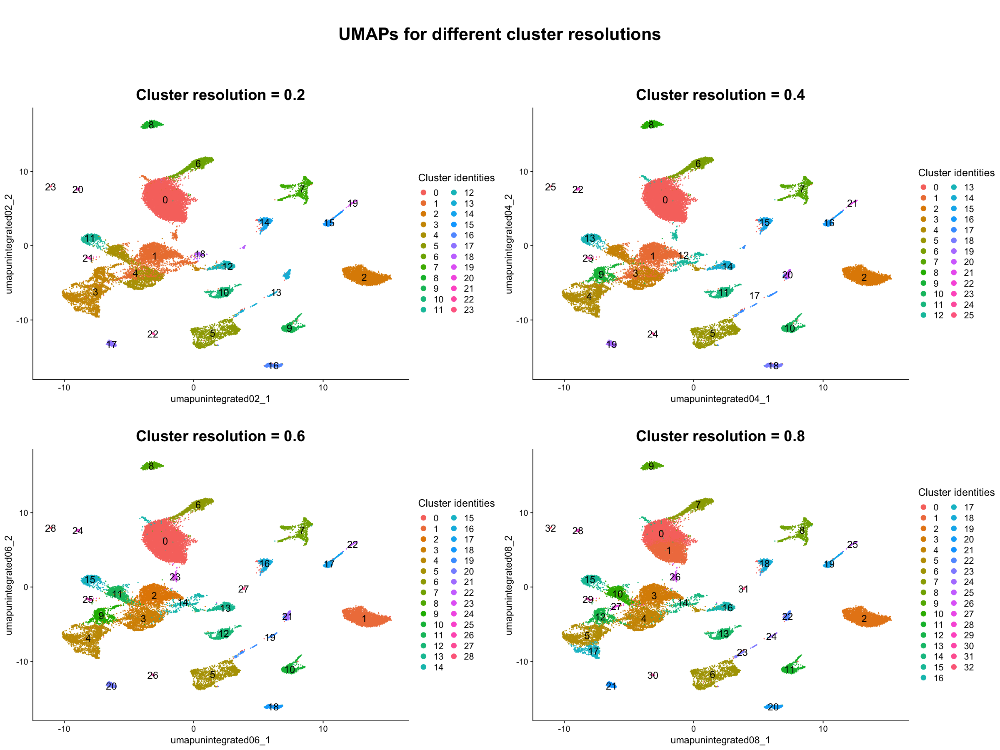

In [66]:
# Arrange plots in grid
grid.arrange(grobs = dimplots, ncol = ceiling(length(dimplots)/2),
             top = textGrob("\nUMAPs for different cluster resolutions\n", gp = gpar(fontsize = 25, fontface = "bold")))

## Feature plot of marker genes

Note that scale in the graph is the expression scale of the feature.

In [67]:
marker_genes = c("snap25a", "mbpa", "olig1", "sox10", "gfap", "gng8", "kiss1", "cd74a", "apoc1", "chgb", "prdx1", "slc6a5", "eomesa")

In [68]:
feature_plots = list()

for (gene in marker_genes) {
    if (gene %in% rownames(LOG_NORM_NOVOALL_filt_umap)) {
       cell_type = case_when(gene == "snap25a" ~ "Differentiated neurons: snap25a",
                          gene == "mbpa" ~ "Oligodendrocytes: mbpa",
                          gene == "olig1" ~ "Oligodendrocytes: olig1",
                          gene == "sox10" ~ "Oligodendrocytes: sox10",
                          gene == "gfap" ~ "\nGlia: gfap",
                          gene == "gng8" ~ "\nDorsal habenula: gng8",
                          gene == "kiss1" ~ "\nVentral habenula: kiss1",
                          gene == "cd74a" ~ "\nMicroglia & immune cells: cd74a", 
                          gene == "apoc1" ~ "\nMicroglia: apoc1",
                          gene == "chgb" ~ "\nHypothalamus: chgb",
                          gene == "prdx1" ~ "\nHypothalamus: prdx1",
                          gene == "slc6a5" ~ "\nHindbrain: slc6a5",
                          gene == "eomesa" ~ "\nForebrain: eomesa")

        plot = FeaturePlot(LOG_NORM_NOVOALL_filt_umap, features = gene) + labs(title = cell_type)

        feature_plots[[gene]] = plot
    
    }

    }

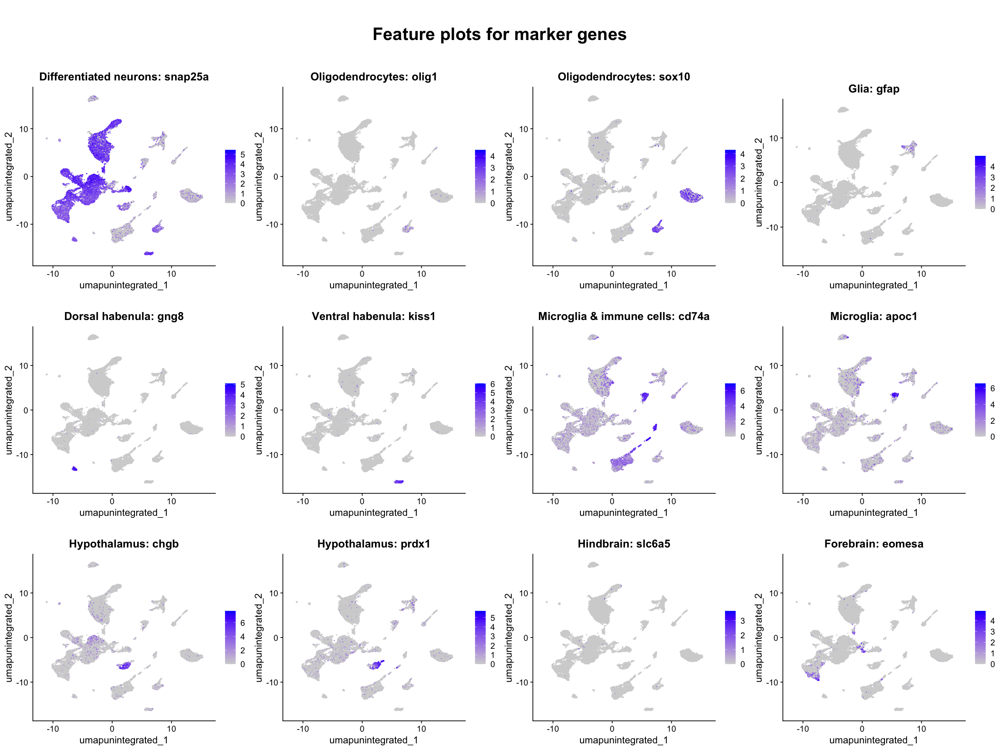

In [69]:
# Arrange plots in grid
grid.arrange(grobs = feature_plots, ncol = 4,
             top = textGrob("\nFeature plots for marker genes\n", gp = gpar(fontsize = 25, fontface = "bold")))

## Final clustering and UMAP
Finally, the user can choose the clustering resolution they want and obtain a final dimplot. As we are only changing the resolution here, there is no need to run the PCA, neighbours again as the resolution is only used from the clustering step onwards.

In [23]:
chosen_res = as.numeric(readline(prompt = "Please enter a resolution value: "))

Please enter a resolution value:  0.6


In [71]:
# find clusters
LOG_NORM_NOVOALL_filt_final = FindClusters(LOG_NORM_NOVOALL_filt_neigh, resolution = chosen_res)

# run umap
LOG_NORM_NOVOALL_filt_final = RunUMAP(LOG_NORM_NOVOALL_filt_final, dims = 1:30, reduction = "pca", 
                                      reduction.name = paste0("umap_unintegrated_", chosen_res))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1050575

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9388
Number of communities: 29
Elapsed time: 3 seconds


19:34:20 UMAP embedding parameters a = 0.9922 b = 1.112

19:34:20 Read 28839 rows and found 30 numeric columns

19:34:20 Using Annoy for neighbor search, n_neighbors = 30

19:34:20 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

19:34:22 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpAkYla2/file111f5383d5d6

19:34:22 Searching Annoy index using 1 thread, search_k = 3000

19:34:27 Annoy recall = 100%

19:34:27 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

19:34:28 Initializing from normalized Laplacian + noise (using RSpectra)

19:34:31 Commencing optimization for 200 epochs, with 1329128 positive edges

19:34:31 Using rng type: pcg

19:34:40 Optimization finished



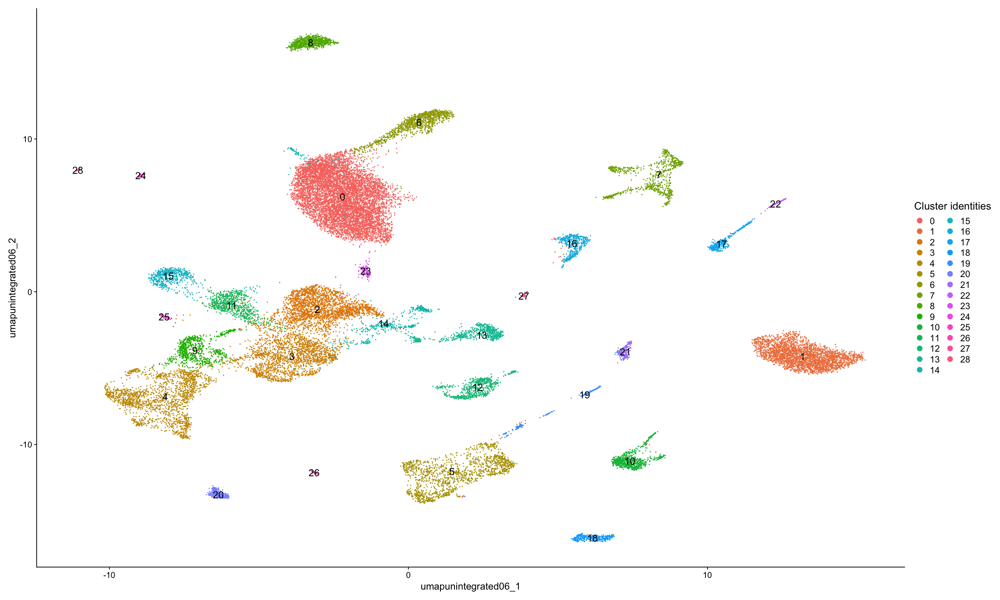

In [72]:
options(repr.plot.width=20, repr.plot.height=12)

# dimplot
DimPlot(LOG_NORM_NOVOALL_filt_final, reduction = paste0("umap_unintegrated_", chosen_res), label = TRUE, label.size = 5) +  
        labs(color = "Cluster identities") + 
        theme(legend.text = element_text(size = 13),
                  legend.title = element_text(size = 15),
                  plot.title = element_text(size = 22, hjust = 0.5))

### (OPTIONAL) Remove problematic clusters by cluster number --> probably best to do this later though

In [3]:
# Filter out problematic clusters from LOG_NORM_NOVOALL_filt_final@meta.data
user_clusters_to_remove = readline(prompt = "Please enter the numbers of the clusters to remove, separated by a comma :")
clusters_to_remove = as.numeric(str_split_1(user_clusters_to_remove, ","))

Please enter the numbers of the clusters to remove, separated by a comma : 0,1,2,3,4,5,6,7,8,9


In [13]:
dim = as.numeric(readline(prompt = "Please enter dimension value for dims arg in FindNeighbors: "))

Please enter dimension value for dims arg in FindNeighbors:  30


In [10]:
LOG_NORM_NOVOALL_filt_final = subset(LOG_NORM_NOVOALL_filt_final, idents = clusters_to_remove, invert = TRUE) # if you want to keep these clusters, invert = FALSE

# run PCA
LOG_NORM_NOVOALL_filt_final = RunPCA(LOG_NORM_NOVOALL_filt_final)

# find neighbours 
LOG_NORM_NOVOALL_filt_final <- FindNeighbors(LOG_NORM_NOVOALL_filt_final, dims = 1:dim, reduction = "pca")

# find clusters
LOG_NORM_NOVOALL_filt_final = FindClusters(LOG_NORM_NOVOALL_filt_final, resolution = chosen_res)

# run umap 
LOG_NORM_NOVOALL_filt_final = RunUMAP(LOG_NORM_NOVOALL_filt_final, dims = 1:30, reduction = "pca", reduction.name = "umap_final")

Warning message:
“The following 2 features requested have zero variance; running reduction without them: dclk1b, si:ch211-277c7.6”
PC_ 1 
Positive:  tmsb2, egr4, zgc:122979, syt1a, atp1b1b, scg2b, pcp4a, nrgna, elavl4, stmn4l 
	   phactr3b, adgrb1b, rgs16, snap25b, kctd4, itm2cb, camk2a, adcyap1b, rasd2, gap43 
	   gad2, nrn1a, chga, uchl1, cplx2l, nell2b, vgf, rergla, rtn4rl2a, si:dkeyp-72h1.1 
Negative:  zgc:158423, anxa2a, etv2, krt18a.1, flt1, icn, krt94, cldn5b, socs3a, sox7 
	   akap12b, kdrl, cxcl12b, s100a10b, sparc, si:ch211-145b13.6, ch25h, klf2a, rgcc, krt8 
	   si:dkey-126g1.9, hopx, egfl7, gstp1, il13ra1, cdc42ep5, tagln2, si:ch211-156j16.1, rbpms2b, cnn2 
PC_ 2 
Positive:  fgfbp3, mfge8a, apof, si:dkey-238o13.4, msrb2, crtac1a, slc1a2b, cyp4t8, aqp1a.1, atp1a1b 
	   fgfr2, cd81b, eno1b, atp1b4, slc6a11b, ucp1, slc4a4a, cx43, dio2, ptn 
	   robo4, hspb15, rhbg, cyp26b1, zgc:101744, gpm6bb, ptgdsb.2, si:dkey-85k7.7, ppap2d, elovl2 
Negative:  tmsb4x, etv2, krt18a.1, anxa2a,

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 37260
Number of edges: 1463864

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9520
Number of communities: 33
Elapsed time: 4 seconds


Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
21:15:43 UMAP embedding parameters a = 0.9922 b = 1.112

21:15:43 Read 37260 rows and found 30 numeric columns

21:15:43 Using Annoy for neighbor search, n_neighbors = 30

21:15:43 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

21:15:45 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//Rtmp9kq534/file7a24de954a0

21:15:45 Searching Annoy index using 1 thread, search_k = 3000

21:15:52 Annoy recall = 100%

21:15:52 Commencing smooth kNN distance calibrat

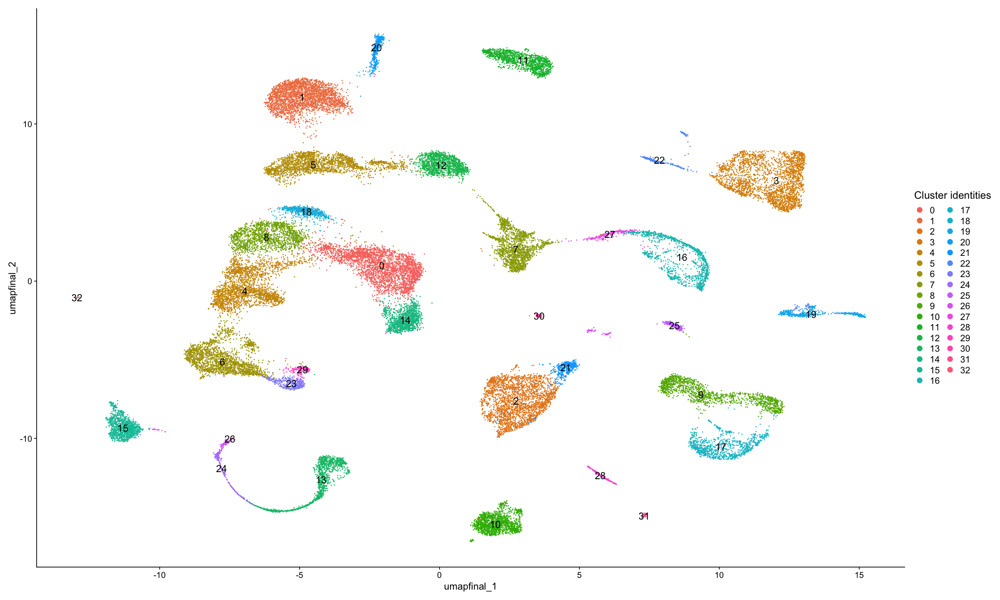

In [12]:
options(repr.plot.width=20, repr.plot.height=12)

# final dimplot
DimPlot(LOG_NORM_NOVOALL_filt_final, reduction = "umap_final", label = TRUE, label.size = 5) +  
        labs(color = "Cluster identities") + 
        theme(legend.text = element_text(size = 13),
                  legend.title = element_text(size = 15),
                  plot.title = element_text(size = 22, hjust = 0.5))

### Save final file

In [73]:
# save
user_dir6 = readline(prompt = "Please enter file directory to save LOG_NORM_NOVOALL_filt_final: ")
saveRDS(LOG_NORM_NOVOALL_filt_final, user_dir6)

Please enter file directory to save LOG_NORM_NOVOALL_filt_final:  ../data_files2/LOG_NORM_NOVOALL_filt_final.rds


## Comparing dimplots and clusters by samples to see if we need to integrate

In [24]:
final_res = chosen_res

In [7]:
# load the file we need (saved above)
LOG_NORM_NOVOALL_filt_final = readRDS(user_dir6)

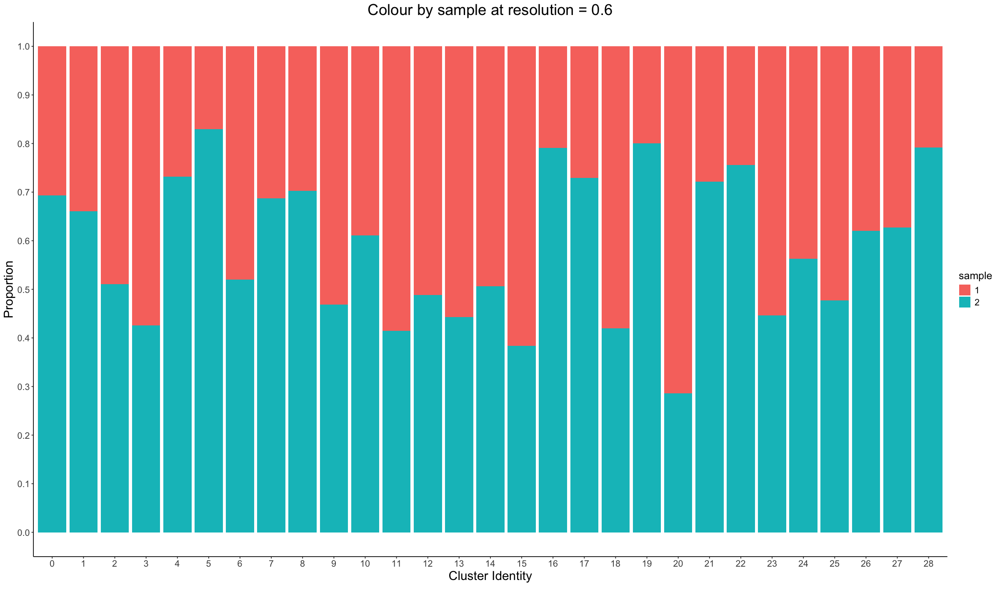

In [86]:
# Compare the percentage of genotype per cluster for samples 1 and 2

n_cells_cluster = LOG_NORM_NOVOALL_filt_final@meta.data %>% 
                    select(c("orig.ident", "genotype", ends_with(as.character(final_res)), "sample")) %>%
                    rename(seurat_clusters = 3)

# Barplot of proportion of cells in each cluster, coloured by genotype
n_cells_cluster %>% ggplot() +
                           geom_bar(aes(x = seurat_clusters, fill = sample), position = "fill") + 
                           scale_y_continuous(breaks = seq(0, 1.0, by = 0.1)) + 
                           theme_classic() + 
                           labs(x = "Cluster Identity\n", y = "Proportion", title = paste0("Colour by sample at resolution = ", as.character(final_res))) +  
                           theme(axis.text.x = element_text(vjust = 1, size = 13),
                                  axis.text.y = element_text(size = 13),
                                  axis.title.x = element_text(size = 18),
                                  axis.title.y = element_text(size = 18),
                                  legend.text = element_text(size = 13),
                                  legend.title = element_text(size = 15),
                                  plot.title = element_text(size = 22, hjust = 0.5))

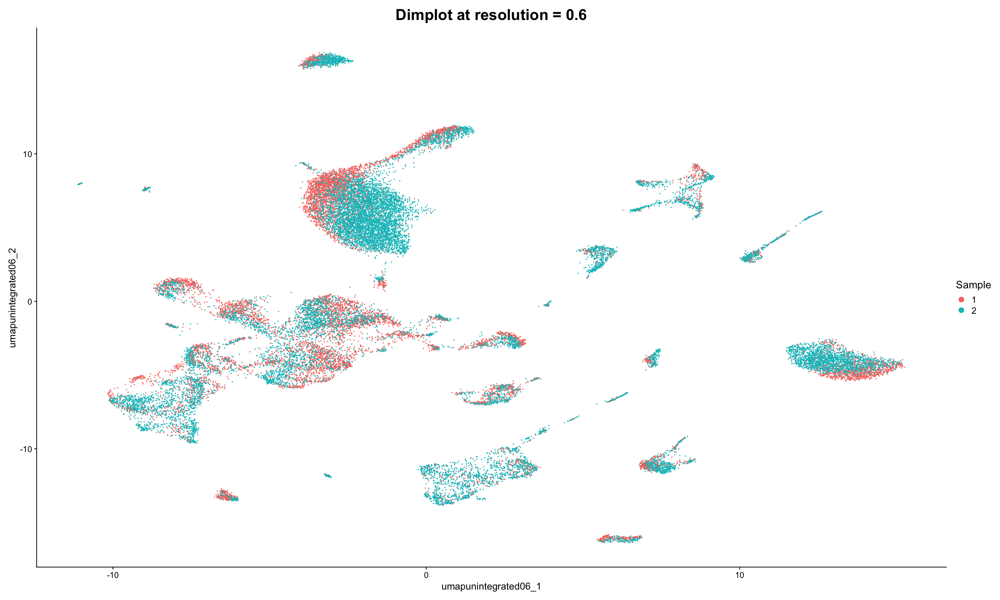

In [87]:
# Compare the dimplots for the samples
DimPlot(LOG_NORM_NOVOALL_filt_final, reduction = paste0("umap_unintegrated_", final_res), 
                   label = FALSE, label.size = 5, group.by = "sample") +  
                    labs(color = "Sample", title = paste0("Dimplot at resolution = ", as.character(final_res))) + 
                    theme(legend.text = element_text(size = 13),
                              legend.title = element_text(size = 15),
                              plot.title = element_text(size = 22, hjust = 0.5))

## Integrate if needed and reperform dimensional reductions and clusteringx
Integration is needed if the clusters contain unequal amount of the samples, e.g., if there were more of sample 2 than sample 1 in most of the cluster.

### Integrate

In [8]:
LOG_NORM_NOVOALL_filt_integ = IntegrateLayers(object = LOG_NORM_NOVOALL_filt_final, 
                                              method = CCAIntegration, 
                                              normalization.method = "LogNormalize", verbose = F)

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”
Warning message:
“The `slot` argument of `SetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”


### Scale data

In [36]:
LOG_NORM_NOVOALL_filt_integ = ScaleData(LOG_NORM_NOVOALL_filt_integ)

Centering and scaling data matrix



In [37]:
# save normalised and scaled data 
int_dir_1 = readline(prompt = "Please enter the file directory to save LOG_NORM_NOVOALL_filt_integ: ") # remember to add the .rds extension
saveRDS(LOG_NORM_NOVOALL_filt_integ, file = int_dir_1) 

Please enter the file directory to save LOG_NORM_NOVOALL_filt_integ:  ../data_files2/LOG_NORM_NOVOALL_filt_integ.rds


### PCA

In [38]:
LOG_NORM_NOVOALL_filt_integ_PCA = RunPCA(LOG_NORM_NOVOALL_filt_integ)

PC_ 1 
Positive:  zgc:64051, ENSDARG00000105408, ENSDARG00000096655, arpc1b, pfn1, b2m, ENSDARG00000095562, cd74b, srgn, mhc2daa 
	   ENSDARG00000071437, lcp1, ENSDARG00000101785, si:dkey-27i16.2, coro1a, itm2bb, mhc1uba, cd74a, cxcr4b, wasb 
	   ENSDARG00000087645, rgs13, si:busm1-266f07.1, spi1b, vsir, ENSDARG00000088612, ENSDARG00000055504, si:ch211-79k12.1, mpeg1.1, ENSDARG00000057787 
Negative:  scg2b, atp1b1b, nrxn1a, egr4, ENSDARG00000105529, bdnf, nrn1a, nptx1l, stmn4l, gap43 
	   hspa8b, trim9, dnajb4, slc35g2a, ENSDARG00000097648, homer1b, vamp1a, scg3, itm2cb, uchl1 
	   ndrg3a, TENT5D, NELL2, chga, PPP4R4, ADGRB1.1, ENSDARG00000075513, glipr1b, pcp4a, chn1 
PC_ 2 
Positive:  dhrs12la, cldnk, csrp1b, ENSDARG00000074285, ENSDARG00000095294, timd4, ENSDARG00000036186, ENSDARG00000089828, mpz, ENSDARG00000089255 
	   stxbp6l, plp1b, cdaa, cd9b, ENSDARG00000071454, MYRF, gjb1a, qki2, ppp1r14aa, cd82a 
	   fabp2, ninj2, ENSDARG00000094045, cd59, tmem125b, ENSDARG00000113045, ENSD

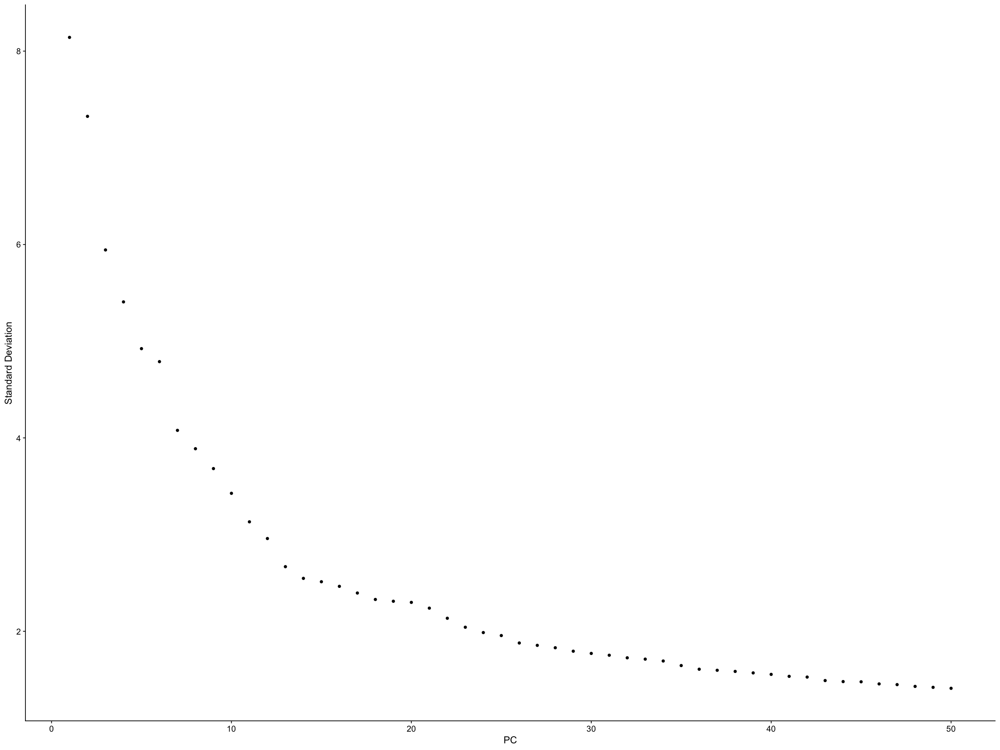

In [18]:
# check elbow plot
ElbowPlot(LOG_NORM_NOVOALL_filt_integ, ndims = 50)

In [39]:
# save data after applying PCA
int_dir_2 = readline(prompt = "Please enter the file directory to save LOG_NORM_NOVOALL_filt_integ_PCA: ") # remember to add the .rds extension
saveRDS(LOG_NORM_NOVOALL_filt_integ_PCA, file = int_dir_2) 

Please enter the file directory to save LOG_NORM_NOVOALL_filt_integ_PCA:  ../data_files2/LOG_NORM_NOVOALL_filt_integ_PCA.rds


### Find neighbours

In [40]:
# Find neighbours (new reduction which is "integrated.dr")
dim = as.numeric(readline(prompt = "Please enter the second dim identified from elbow plot, e.g., 30: "))
LOG_NORM_NOVOALL_filt_integ_neigh = FindNeighbors(LOG_NORM_NOVOALL_filt_integ_PCA, reduction = "integrated.dr", dims = 1:dim)

Please enter the second dim identified from elbow plot, e.g., 30:  30


Computing nearest neighbor graph

Computing SNN



In [41]:
# save file after finding neighbours
int_dir_3 = readline(prompt = "Please enter the file directory to save LOG_NORM_NOVOALL_filt_integ_neigh: ") # remember to add the .rds extension
saveRDS(LOG_NORM_NOVOALL_filt_integ_neigh, file = int_dir_3) 

Please enter the file directory to save LOG_NORM_NOVOALL_filt_integ_neigh:  ../data_files2/LOG_NORM_NOVOALL_filt_integ_neigh.rds


### Find clusters

In [42]:
# Check clustering at different resolution values
res_int = as.numeric(str_split_1(readline(prompt = "Please enter resolution values separated by a comma: "), ",")) # split string at the comma and convert chars to numeric

Please enter resolution values separated by a comma:  0.2,0.4,0.6,0.8


In [43]:
# Find clusters
LOG_NORM_NOVOALL_filt_integ_clust = FindClusters(LOG_NORM_NOVOALL_filt_integ_neigh, resolution = res_int)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1216285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9728
Number of communities: 25
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1216285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9548
Number of communities: 29
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1216285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9422
Number of communities: 32
Elapsed time: 4 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1216285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9301
Number of communities: 34
Elapsed time: 4 seconds


In [44]:
# save file
int_dir_4 = readline(prompt = "Please enter the file directory to save LOG_NORM_NOVOALL_filt_integ_clust: ") # remember to add the .rds extension
saveRDS(LOG_NORM_NOVOALL_filt_integ_clust, file = int_dir_4) 

Please enter the file directory to save LOG_NORM_NOVOALL_filt_integ_clust:  ../data_files2/LOG_NORM_NOVOALL_filt_integ_clust.rds


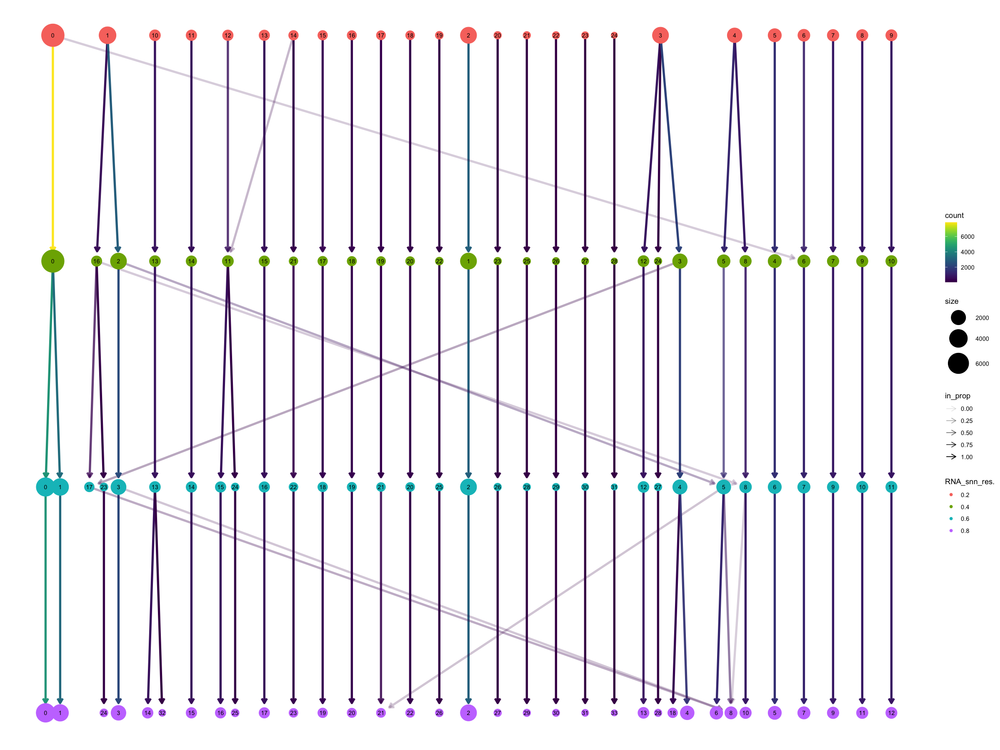

In [45]:
# clustree
clustree(LOG_NORM_NOVOALL_filt_integ_clust)

#### Cluster quality check before UMAP

In [48]:
# check the proportion of genotype and sample in each cluster
plots_genotype = list()
plots_sample = list()

for (value in res_int) {
    resolution = as.character(value)

    prop_cells_cluster = LOG_NORM_NOVOALL_filt_integ_clust@meta.data %>% 
                    select(c("orig.ident", "genotype", ends_with(resolution), "sample")) %>% 
                    rename(seurat_clusters = 3) # rename the last col as seurat cluster to use in plot later

    # Barplot of proportion of cells in each cluster, coloured by genotype
    p1 = ggplot(prop_cells_cluster) +
            geom_bar(aes(x = seurat_clusters, fill = genotype), position = "fill") + 
            scale_y_continuous(breaks = seq(0, 1.0, by = 0.1)) + 
            theme_classic() + 
            labs(x = "Cluster Identity\n", y = "Proportion", title = paste0("Resolution = ", resolution)) +  
            theme(axis.text.x = element_text(vjust = 1, size = 13),
                  axis.text.y = element_text(size = 13),
                  axis.title.x = element_text(size = 18),
                  axis.title.y = element_text(size = 18),
                  legend.text = element_text(size = 13),
                  legend.title = element_text(size = 15),
                  plot.title = element_text(size = 22, hjust = 0.5))

    # Barplot of proportion of cells in each cluster, coloured by sample
    p2 = ggplot(prop_cells_cluster) +
            geom_bar(aes(x = seurat_clusters, fill = sample), position = "fill") + 
            scale_y_continuous(breaks = seq(0, 1.0, by = 0.1)) + 
            theme_classic() + 
            labs(x = "Cluster Identity\n", y = "Proportion", title = paste0("Resolution = ", resolution)) +  
            theme(axis.text.x = element_text(vjust = 1, size = 13),
                  axis.text.y = element_text(size = 13),
                  axis.title.x = element_text(size = 18),
                  axis.title.y = element_text(size = 18),
                  legend.text = element_text(size = 13),
                  legend.title = element_text(size = 15),
                  plot.title = element_text(size = 22, hjust = 0.5))
    
    # save to lists
    plots_genotype[[paste0("plot", resolution)]] = p1
    plots_sample[[paste0("plot", resolution)]] = p2
    
    }

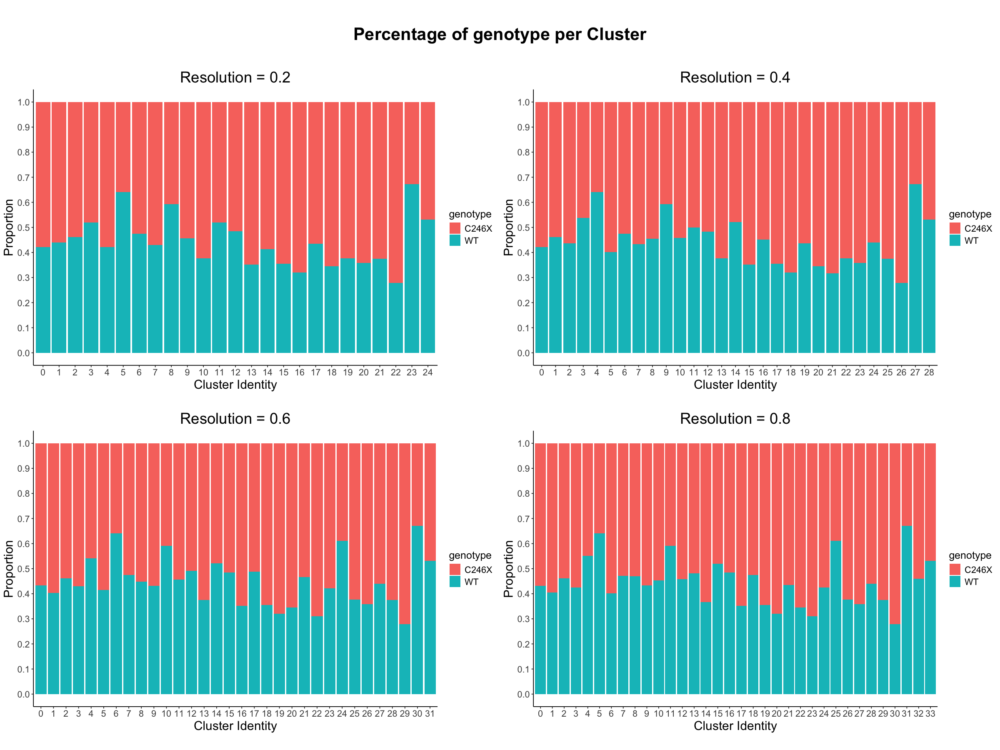

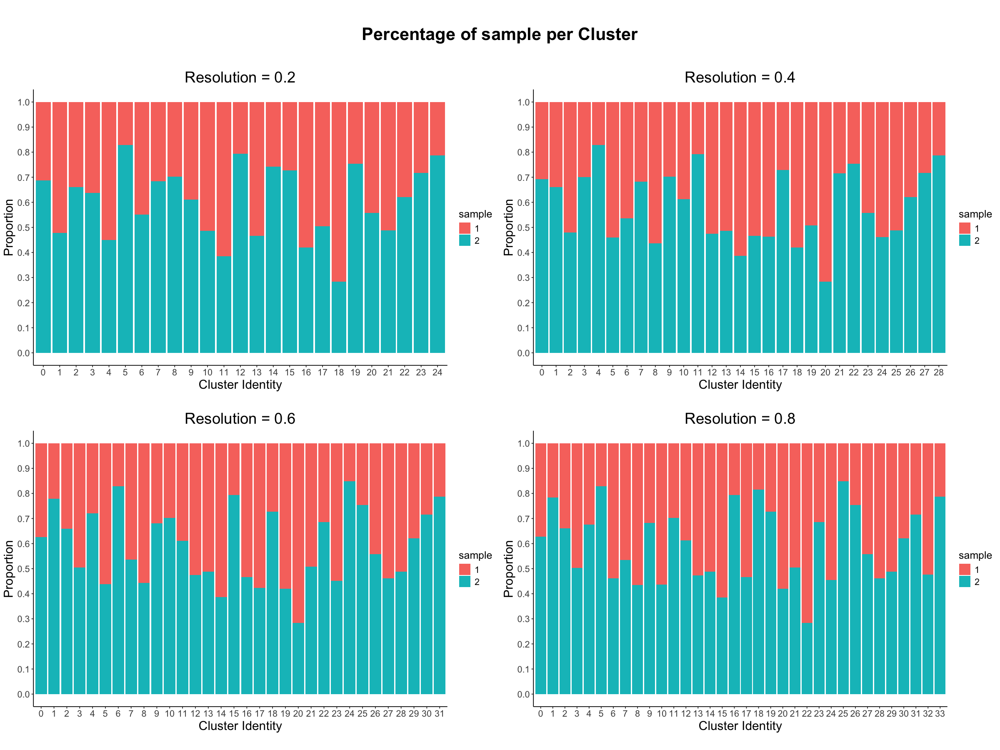

In [49]:
# Arrange plots in grid
grid.arrange(grobs = plots_genotype, ncol = ceiling(length(plots_genotype)/2),
             top = textGrob("\nPercentage of genotype per Cluster\n", gp = gpar(fontsize = 25, fontface = "bold")))

grid.arrange(grobs = plots_sample, ncol = ceiling(length(plots_sample)/2),
             top = textGrob("\nPercentage of sample per Cluster\n", gp = gpar(fontsize = 25, fontface = "bold")))

### UMAP

Look at different resolutions

In [63]:
# loop through the resolutions and run findclusters and umap for each value

dimplots_int_overall = list()

for (value in res_int) {
    
    # find clusters
    clust_seurat = FindClusters(LOG_NORM_NOVOALL_filt_integ_neigh, resolution = value)

    # run umap
    reduction_name = paste0("umap_integrated", value)
    umap_seurat = RunUMAP(clust_seurat, dims = 1:dim, reduction = "integrated.dr", reduction.name = reduction_name)

    # dimension plot
    plot1 = DimPlot(umap_seurat, reduction = reduction_name, label = TRUE, label.size = 5) +  
            labs(color = "Cluster identities", title = paste0("\nCluster resolution = ", value)) + 
            theme(legend.text = element_text(size = 13),
                  legend.title = element_text(size = 15),
                  plot.title = element_text(size = 22, hjust = 0.5))
    
    dimplots_int_overall[[paste0("plot1", value)]] = plot1 
    
    }

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1216285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9728
Number of communities: 25
Elapsed time: 3 seconds


15:52:46 UMAP embedding parameters a = 0.9922 b = 1.112

15:52:46 Read 28839 rows and found 30 numeric columns

15:52:46 Using Annoy for neighbor search, n_neighbors = 30

15:52:46 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:52:47 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpykCN6w/file21f526694b44

15:52:47 Searching Annoy index using 1 thread, search_k = 3000

15:52:53 Annoy recall = 100%

15:52:53 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

15:52:53 Initializing from normalized Laplacian + noise (using RSpectra)

15:52:57 Commencing optimization for 200 epochs, with 1351522 positive edges

15:52:57 Using rng type: pcg

15:53:06 Optimization finished



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1216285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9548
Number of communities: 29
Elapsed time: 3 seconds


15:53:10 UMAP embedding parameters a = 0.9922 b = 1.112

15:53:10 Read 28839 rows and found 30 numeric columns

15:53:10 Using Annoy for neighbor search, n_neighbors = 30

15:53:10 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:53:11 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpykCN6w/file21f54acc710f

15:53:11 Searching Annoy index using 1 thread, search_k = 3000

15:53:16 Annoy recall = 100%

15:53:17 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

15:53:17 Initializing from normalized Laplacian + noise (using RSpectra)

15:53:21 Commencing optimization for 200 epochs, with 1351522 positive edges

15:53:21 Using rng type: pcg

15:53:30 Optimization finished



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1216285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9422
Number of communities: 32
Elapsed time: 4 seconds


15:53:34 UMAP embedding parameters a = 0.9922 b = 1.112

15:53:34 Read 28839 rows and found 30 numeric columns

15:53:34 Using Annoy for neighbor search, n_neighbors = 30

15:53:34 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:53:36 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpykCN6w/file21f53412b626

15:53:36 Searching Annoy index using 1 thread, search_k = 3000

15:53:41 Annoy recall = 100%

15:53:41 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

15:53:42 Initializing from normalized Laplacian + noise (using RSpectra)

15:53:46 Commencing optimization for 200 epochs, with 1351522 positive edges

15:53:46 Using rng type: pcg

15:53:55 Optimization finished



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1216285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9301
Number of communities: 34
Elapsed time: 4 seconds


15:53:59 UMAP embedding parameters a = 0.9922 b = 1.112

15:53:59 Read 28839 rows and found 30 numeric columns

15:53:59 Using Annoy for neighbor search, n_neighbors = 30

15:53:59 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:54:01 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpykCN6w/file21f53874937f

15:54:01 Searching Annoy index using 1 thread, search_k = 3000

15:54:06 Annoy recall = 100%

15:54:06 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

15:54:06 Initializing from normalized Laplacian + noise (using RSpectra)

15:54:10 Commencing optimization for 200 epochs, with 1351522 positive edges

15:54:10 Using rng type: pcg

15:54:19 Optimization finished



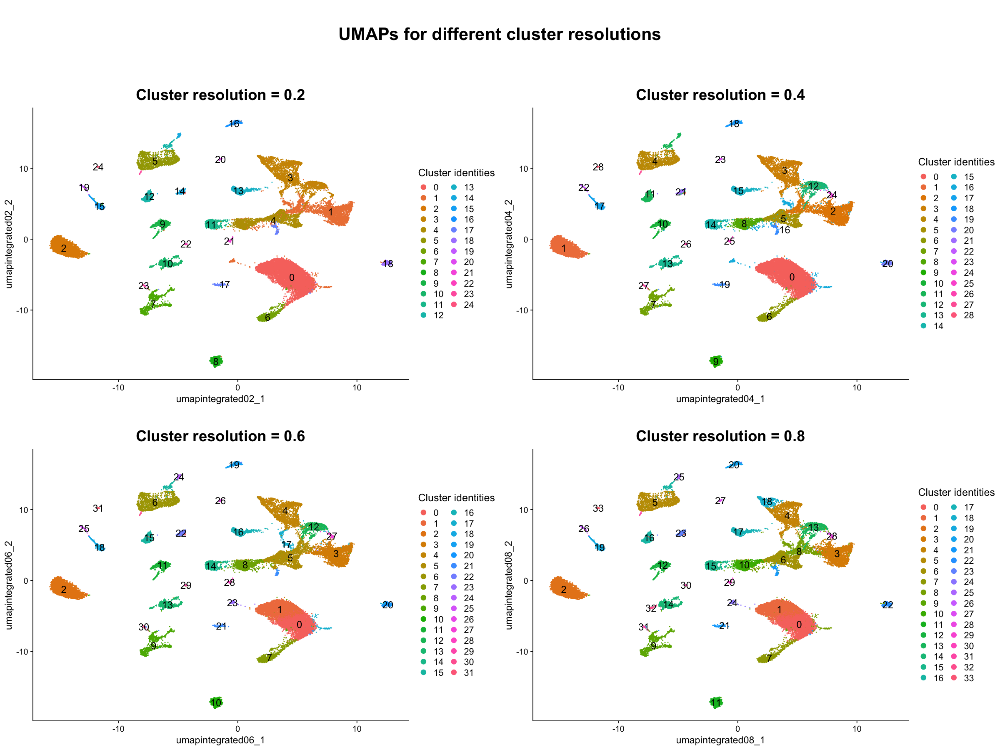

In [64]:
# Arrange plots in grid
grid.arrange(grobs = dimplots_int_overall, ncol = ceiling(length(dimplots_int_overall)/2),
             top = textGrob("\nUMAPs for different cluster resolutions\n", gp = gpar(fontsize = 25, fontface = "bold")))

#### Cluster quality check after UMAP (feature plots + dim plots)

In [68]:
# choose a specific resolution value to check the feature plots 
chosen_res_int = as.numeric(readline(prompt = "Pleae enter resolution value to explore feature plots: "))

# run clustering at this res
LOG_NORM_NOVOALL_filt_integ_clust_chosen = FindClusters(LOG_NORM_NOVOALL_filt_integ_neigh, resolution = chosen_res_int)

# first get run the umap at this res
LOG_NORM_NOVOALL_filt_integ_umap_chosen = RunUMAP(LOG_NORM_NOVOALL_filt_integ_clust_chosen, dims = 1:dim, 
                                           reduction = "integrated.dr", reduction.name = paste0("umap_integ", chosen_res_int))

Pleae enter resolution value to explore feature plots:  0.4


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1216285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9548
Number of communities: 29
Elapsed time: 3 seconds


15:59:19 UMAP embedding parameters a = 0.9922 b = 1.112

15:59:19 Read 28839 rows and found 30 numeric columns

15:59:19 Using Annoy for neighbor search, n_neighbors = 30

15:59:19 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:59:20 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpykCN6w/file21f5489f8311

15:59:20 Searching Annoy index using 1 thread, search_k = 3000

15:59:26 Annoy recall = 100%

15:59:26 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

15:59:26 Initializing from normalized Laplacian + noise (using RSpectra)

15:59:30 Commencing optimization for 200 epochs, with 1351522 positive edges

15:59:30 Using rng type: pcg

15:59:39 Optimization finished



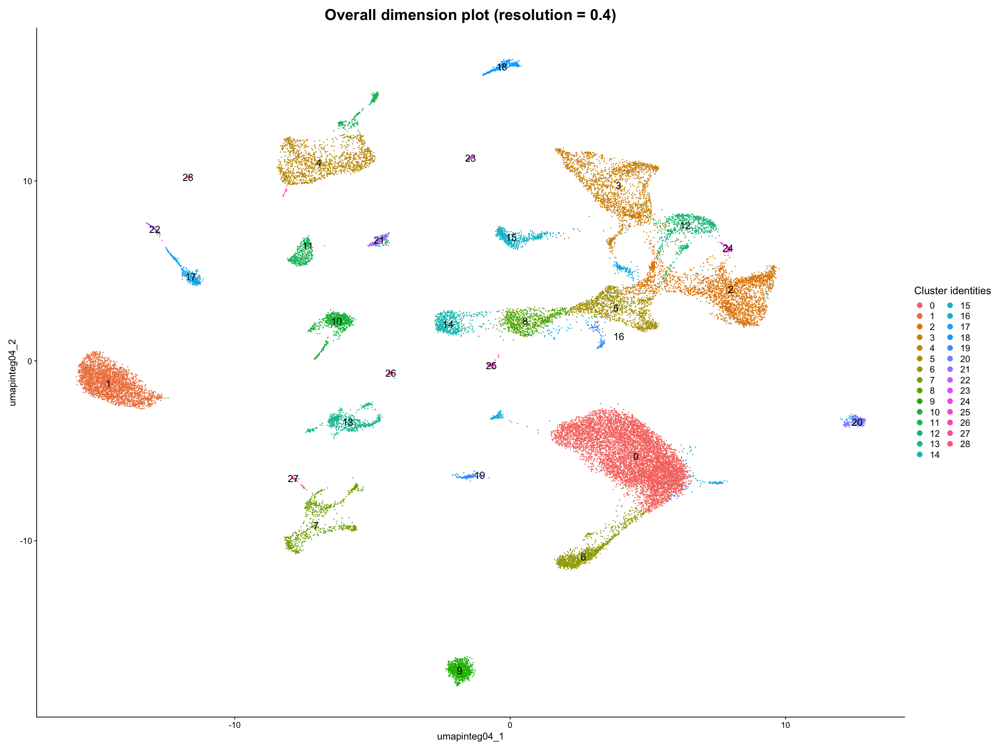

In [70]:
# Overall dimplot
DimPlot(LOG_NORM_NOVOALL_filt_integ_umap_chosen, reduction = paste0("umap_integ", chosen_res_int), label = TRUE, label.size = 5) +  
        labs(color = "Cluster identities", title = paste0("Overall dimension plot (resolution = ", as.character(chosen_res_int), ")")) + 
        theme(legend.text = element_text(size = 13),
                  legend.title = element_text(size = 15),
                  plot.title = element_text(size = 22, hjust = 0.5))

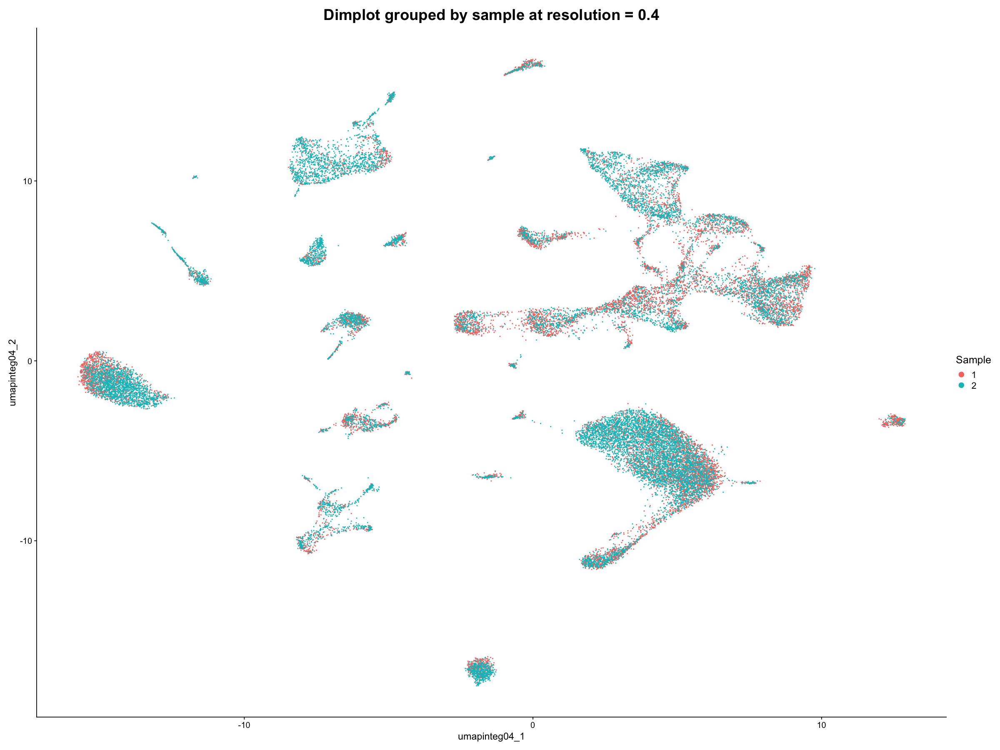

In [72]:
# Dimplot grouped by sample
DimPlot(LOG_NORM_NOVOALL_filt_integ_umap_chosen, reduction = paste0("umap_integ", chosen_res_int), 
                   label = FALSE, label.size = 5, group.by = "sample") +  
                    labs(color = "Sample", title = paste0("Dimplot grouped by sample at resolution = ", as.character(chosen_res_int))) + 
                    theme(legend.text = element_text(size = 13),
                              legend.title = element_text(size = 15),
                              plot.title = element_text(size = 22, hjust = 0.5))

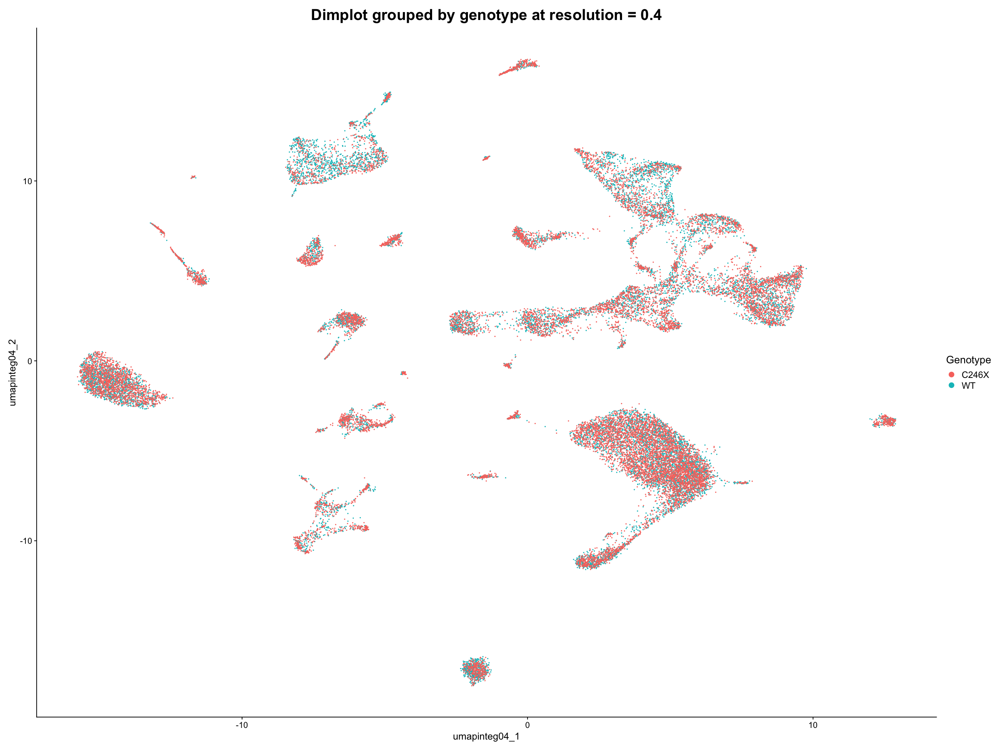

In [73]:
# Dimplot grouped by genotype
DimPlot(LOG_NORM_NOVOALL_filt_integ_umap_chosen, reduction = paste0("umap_integ", chosen_res_int), 
                   label = FALSE, label.size = 5, group.by = "genotype") +  
                    labs(color = "Genotype", title = paste0("Dimplot grouped by genotype at resolution = ", as.character(chosen_res_int))) + 
                    theme(legend.text = element_text(size = 13),
                              legend.title = element_text(size = 15),
                              plot.title = element_text(size = 22, hjust = 0.5))

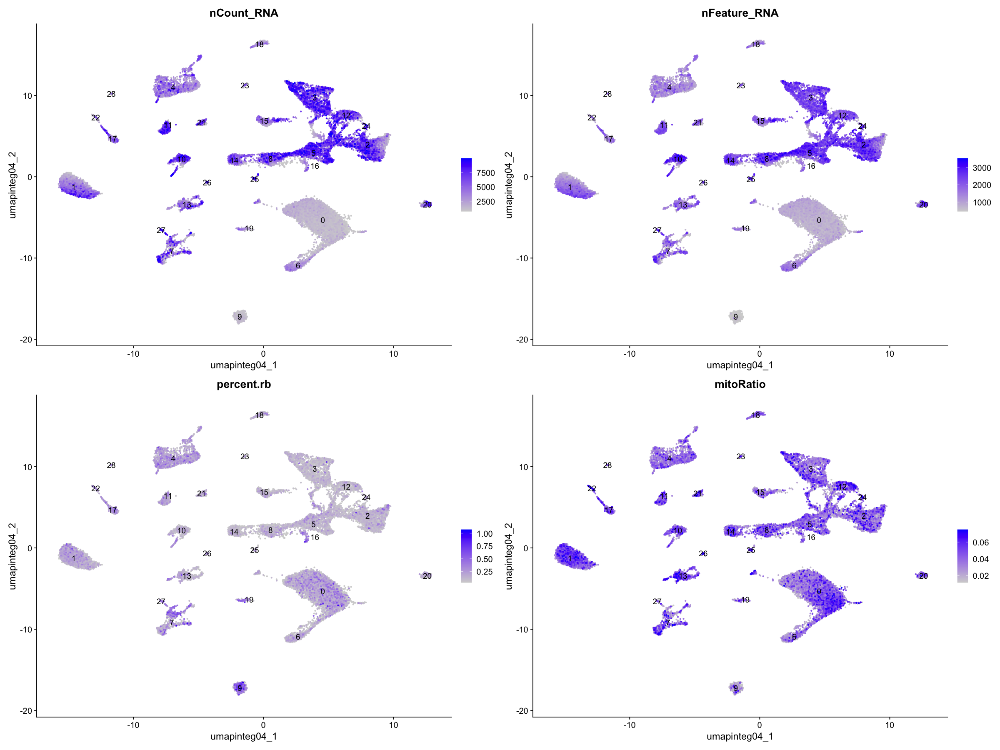

In [78]:
# Column feature plots
options(repr.plot.width=20, repr.plot.height=15)

# Determine metrics to plot
metrics <-  c("nCount_RNA", "nFeature_RNA", "percent.rb", "mitoRatio")

FeaturePlot(LOG_NORM_NOVOALL_filt_integ_umap_chosen, 
            reduction = paste0("umap_integ", chosen_res_int), 
            features = metrics,
            pt.size = 0.4, 
            order = TRUE,
            min.cutoff = 'q10',
            label = TRUE)

In [75]:
# Marker genes feature plots
marker_genes = c("snap25a", "mbpa", "olig1", "sox10", "gfap", "gng8", "kiss1", "cd74a", "apoc1", "chgb", "prdx1", "slc6a5", "eomesa")

feature_plots_int = list()

for (gene in marker_genes) {
    if (gene %in% rownames(LOG_NORM_NOVOALL_filt_integ_umap_chosen)) {
       cell_type = case_when(gene == "snap25a" ~ "Differentiated neurons: snap25a",
                          gene == "mbpa" ~ "Oligodendrocytes: mbpa",
                          gene == "olig1" ~ "Oligodendrocytes: olig1",
                          gene == "sox10" ~ "Oligodendrocytes: sox10",
                          gene == "gfap" ~ "\nGlia: gfap",
                          gene == "gng8" ~ "\nDorsal habenula: gng8",
                          gene == "kiss1" ~ "\nVentral habenula: kiss1",
                          gene == "cd74a" ~ "\nMicroglia & immune cells: cd74a", 
                          gene == "apoc1" ~ "\nMicroglia: apoc1",
                          gene == "chgb" ~ "\nHypothalamus: chgb",
                          gene == "prdx1" ~ "\nHypothalamus: prdx1",
                          gene == "slc6a5" ~ "\nHindbrain: slc6a5",
                          gene == "eomesa" ~ "\nForebrain: eomesa")

        plot = FeaturePlot(LOG_NORM_NOVOALL_filt_integ_umap_chosen, features = gene) + labs(title = cell_type)

        feature_plots_int[[gene]] = plot
    
    }

    }


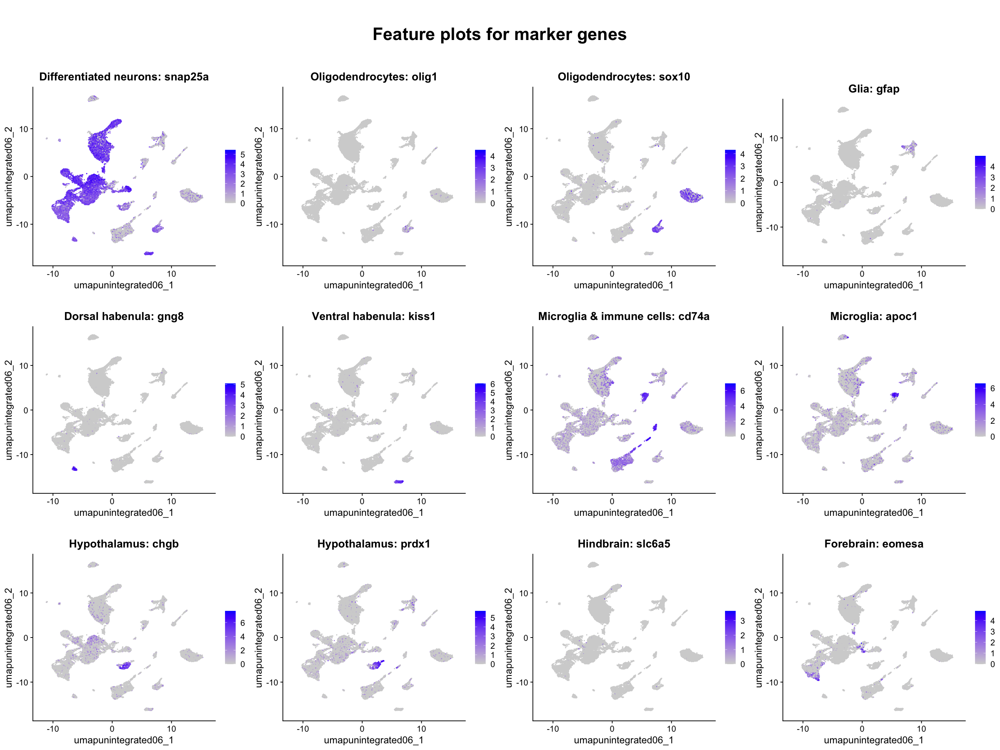

In [79]:
# Arrange plots in grid
grid.arrange(grobs = feature_plots_int, ncol = 4,
             top = textGrob("\nFeature plots for marker genes\n", gp = gpar(fontsize = 25, fontface = "bold")))

## Post integration final file to save

In [81]:
resolution = as.numeric(readline(prompt = "Please enter final resolution value: "))

Please enter final resolution value:  0.4


In [83]:
# find clusters
LOG_NORM_NOVOALL_filt_integ_final_clust = FindClusters(LOG_NORM_NOVOALL_filt_integ_neigh, resolution = resolution)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28839
Number of edges: 1216285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9548
Number of communities: 29
Elapsed time: 3 seconds


In [85]:
# save
dir1_final = readline(prompt = "Enter directory to save LOG_NORM_NOVOALL_filt_integ_final_clust: ") # remember .rds after filename
saveRDS(LOG_NORM_NOVOALL_filt_integ_final_clust, dir1_final)

Enter directory to save LOG_NORM_NOVOALL_filt_integ_final_clust:  ../data_files2/LOG_NORM_NOVOALL_filt_integ_final_clust.rds


In [86]:
# run umap
LOG_NORM_NOVOALL_filt_integ_final = RunUMAP(LOG_NORM_NOVOALL_filt_integ_final_clust, dims = 1:dim, reduction = "integrated.dr", 
                                      reduction.name = paste0("umap_integrated_", resolution))

16:15:05 UMAP embedding parameters a = 0.9922 b = 1.112

16:15:05 Read 28839 rows and found 30 numeric columns

16:15:05 Using Annoy for neighbor search, n_neighbors = 30

16:15:05 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:15:07 Writing NN index file to temp file /var/folders/7b/snpms3c90nqg721sdk5lczdw0000gn/T//RtmpykCN6w/file21f54c01182b

16:15:07 Searching Annoy index using 1 thread, search_k = 3000

16:15:12 Annoy recall = 100%

16:15:12 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

16:15:13 Initializing from normalized Laplacian + noise (using RSpectra)

16:15:17 Commencing optimization for 200 epochs, with 1351522 positive edges

16:15:17 Using rng type: pcg

16:15:25 Optimization finished



In [88]:
dir2_final = readline(prompt = "Enter directory to save LOG_NORM_NOVOALL_filt_integ_final: ") # remember .rds after filename
saveRDS(LOG_NORM_NOVOALL_filt_integ_final, dir2_final)

Enter directory to save LOG_NORM_NOVOALL_filt_integ_final:  ../data_files2/LOG_NORM_NOVOALL_filt_integ_final.rds
